# **Grouping Products by Patterns**  

## 1. Introduction

Every product has certain features that influence sales. One group of such characteristics is the pattern design such as color, texture, ornament, or briefly, a specific set of 2-D eye-pleasing characteristics. It is the habit of companies that they generally specify these features, if they do, as categorical variables in the database and product identification. Though categorical pattern design elements convey a good amount of relational information in analyses, they also miss a lot embedded in the sophistication of the pattern. Take the following images as an example:<br>

<h3 style="color: #6A006A; text-align: center">Figure-1: Which One is My Heart?! </h3><br>

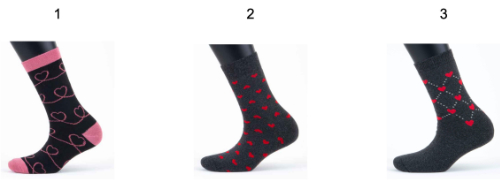<br>
<div align="center"><font size="2">Image by author </font></div>

These are women's socks. The sock in the picture (1) is black; the other two items have dark grey colors. For example, a company that trades these products can categorize them as women's, crew, dark grey, and with heart design. However, each of these items have different shapes and colors of hearts. At the same time, it may be worthwhile to group them with other socks that have a similar or reminiscent pattern.<br>

In this notebook, I have tried to show how we can interpret product patterns and cluster products by those patterns. In doing this, I used clothes as the sample data though any product with some pattern can be subject of this work.<br>

There are five stages to accomplish the task:<br>
**1. Instance segmentation:** We will use DeepLabV3+, a semantic segmentation architecture developed by Google. Semantic segmentation, a computer vision task, assigns semantic labels to every pixel in an image. People used Google's DeepLabV3+ in many suck tasks, but to my knowledge, I haven't come across the use of DeepLabV3+ in pixelwise segmentation of fashion images.<br>
**2. Patch extraction:** Once every pixel is labeled in the image, we will then extract a patch from a clothing; this will be a segment of the wear to be selected as the target item.<br>
**3. Image enhancement:** In case that the patch extracted in the previous stage is fairly small in pixel size, we will enhance it using GAN algorithm. Enhancement allows us to use high-resolution images in the upcoming training stages.<br>
**4. Vectorial representation:** Patches with or without image enhancement will go through Siamese Network and Triplet Loss architecture that will produce their vector representation.<br>
**5. Clustering:** As of the last stage, K-Means clustering will group product images by their vectors.<br>

Not every type of product need to follow the above five stages. If they have high-resolution patch image samples, stages 4 to 5 will be enough. In case images need enhancement due to low resolution, stage 3 is the starting point. Product that don't have patch images need to start from the beginning, yet, for this purpose, we need to find a dataset first.<br>

In [1]:
# Install libraries

!pip install kneed

In [2]:
# Import libraries

import os
os.environ['TF_CPP_MIN_LOG_LEVEL'] = '3'
import copy
import glob
import csv
import matplotlib as mpl
import matplotlib.pyplot as plt
from matplotlib.pyplot import imread
from matplotlib import image as mpimg
import random
import numpy as np
from numpy.linalg import norm
import collections
from collections import defaultdict
from itertools import groupby, count
import pandas as pd
import math
from tabulate import tabulate
from PIL import Image
from IPython.display import display
from sklearn.decomposition import PCA
from sklearn.cluster import KMeans
from kneed import KneeLocator
from sklearn.metrics import silhouette_score
from sklearn.model_selection import train_test_split
import tensorflow as tf
import tensorflow_hub as hub
import tensorflow_addons as tfa
from tensorflow import keras
from tensorflow.keras.applications import ResNet50
from tensorflow.keras.applications import InceptionV3
from tensorflow.keras.applications.inception_v3 import preprocess_input
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler
from tensorflow.keras import Model
from tensorflow.keras.layers import Conv2D, BatchNormalization, Activation, Concatenate, AveragePooling2D, UpSampling2D, Dense, Lambda, Input
from tensorflow.keras.models import load_model
from tensorflow.keras import backend as K
import warnings
import gc

%matplotlib inline

Explanations and images are hyperlinked to their source websites via numbers in a bracket next to or underneath them. One can also find the list of used sources in the notebook's *Sources* section.<br>

In [3]:
# Configurations and initializations

warnings.filterwarnings("ignore")
plt.style.use("fivethirtyeight")

# Create a directory if not exists
!mkdir -p models

tf.config.threading.set_inter_op_parallelism_threads(4)

# TPU
try:
    tpu = tf.distribute.cluster_resolver.TPUClusterResolver()
    print('Running on TPU ', tpu.master())
except ValueError:
    tpu = None

if tpu:
    tf.config.experimental_connect_to_cluster(tpu)
    tf.tpu.experimental.initialize_tpu_system(tpu)
    strategy = tf.distribute.experimental.TPUStrategy(tpu)
else:
    strategy = tf.distribute.get_strategy()
    
print("REPLICAS: ", strategy.num_replicas_in_sync)

REPLICAS:  1


Refer to [[1]](https://www.kaggle.com/code/philculliton/a-simple-tf-2-1-notebook/notebook) for the code for TPU initialization. However, note that I used GPU in the notebook. We used different input image sizes for the two frameworks. 512x512 is for the DeepLabV3+, and 299x299 is for the Siamese Network. ALPHA of 0.2, 1024 TRAIN SAMPLES, and ten EPOCHS are the parameters of the latter. Five EPOCHS are good enough for the  DeepLabV3+. The OUTPUT VECTOR is the number of elements in the encoding vector we learn from the Siamese Network, though this is something we have found through trial and error. We will deliberate on this later.<br>

In [4]:
# If training is required, it's 1; otherwise 0, which means the trained model will be loaded.
TRAIN = 0

# Parameters
TARGET_SIZE = (299, 299)
IMAGE_SIZE = 512
INPUT_SHAPE = TARGET_SIZE + (3,)
TRAIN_SAMPLES = 1024
BUFFER_SIZE = 64
SPLIT_RATIO = 0.8
BATCH_SIZE = 8 * strategy.num_replicas_in_sync
EXE_STEPS = 4
OUTPUT_VECTOR = 16
ALPHA = 0.2
EPOCHS = 5
LR = 1e-4
AUTOTUNE = tf.data.experimental.AUTOTUNE
RANDOM_STATE = 0

## 2. Dataset

If you use porcelain products, you need a porcelain dataset. Training coaster patterns requires a coaster dataset. Since we want to label fashion image pixels, we may use a clothing dataset like DeepFashion.<br>

[DeepFashion](https://mmlab.ie.cuhk.edu.hk/projects/DeepFashion.html)[[2]](https://mmlab.ie.cuhk.edu.hk/projects/DeepFashion.html) data contains over 800,000 images collected from various sources. The database is categorized according to four benchmarks; these are *Attribute Prediction*, *Consumer-to-shop Clothes Retrieval*, *In-shop Clothes Retrieval*, and *Landmark Detection*.<br>

For image semantic segmentation, the *In-shop Retrieval* dataset provides both images and masks, and it's the one we are going to use.<br>

[In-shop Clothes Retrieval Benchmark](http://mmlab.ie.cuhk.edu.hk/projects/DeepFashion/InShopRetrieval.html)[[3]](http://mmlab.ie.cuhk.edu.hk/projects/DeepFashion/InShopRetrieval.html) evaluates the performance of in-shop Clothes Retrieval. This is a large subset of DeepFashion, containing large pose and scale variations. It also has large diversities, large quantities, and rich annotations, including

7,982 number of clothing items;

52,712 number of in-shop clothes images, and ~200,000 cross-pose/scale pairs;

Each image is annotated by bounding box, clothing type and pose type.[[4]](http://mmlab.ie.cuhk.edu.hk/projects/DeepFashion/InShopRetrieval.html)

However, this dataset has three issues that need to be addressed:<br>
1. The data comes in the form of a deep file hierarchy and should be reformatted to only image and mask folders under the data directory.<br>

2. All masks have three channels, but we may want to make them into one channel. Hence, all RGB masks will be greyscale. In the original dataset, pixels are masked with RGB colors, as shown below on the left. We need to greyscale them by labeling each with a class number as the one in the middle. However, RGB colors do not correctly correspond to the names mentioned in the left table as their *readme.md* file suggests. For example, 255-0-0 does not correspond to headwear but hair. The right side table corrects such mapping mistakes, and we see that not all RGBs have a label counterpart, and some are N/A. Because not all images have their masks, we discard them, and removed clothing types will not have a label. Discarded items are skirts, leggings, bags, neckwears, headwears, eyeglasses, and belts. Actually, some of them do not even exist in the data we used.<br>

<h3 style="color: #6A006A; text-align: center">Figure-2: Tree of Files</h3><br>

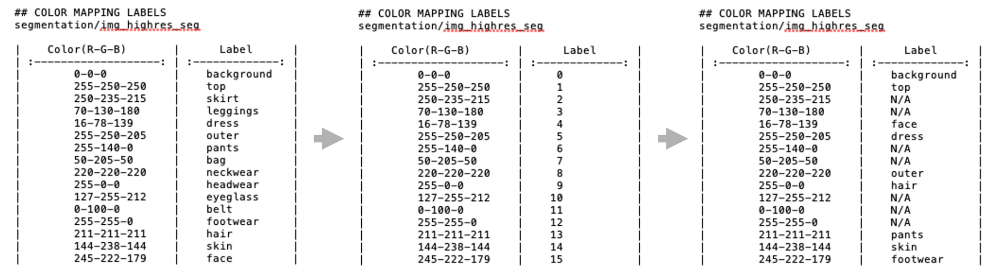<br>
<div align="center"><font size="2">Image by author </font></div>

Source:[[5]](https://drive.google.com/file/d/19EUeP8Oa7lpRkD9CC5LARQ_93XopokaB/view?usp=sharing)<br>

As a result, we end up with nine classes, only five of which are clothing types. These are outer, footwear, pants, top and dress. Since our main concern is grouping products by pattern, this is not a worrying point. A pattern on a t-shirt, sweater or jeans doesn't make much difference. We are interested in the patterns of clothes only not the clothes or their types.<br>

3. Not all images have masks; there are more images than masks. So, we need to filter in only the images with masks.<br>

Our transformed dataset includes 13,752 pairs of images and masks. The original **In-shop Clothes Retrieval Benchmark** has 52,712 images and 13,752 masks.<br>

I wrote a [script](https://github.com/hsaltan/Machine-Learning/tree/main/DeepFashion%20Data%20Preparation) to address the above issues[[6]](https://github.com/hsaltan/Machine-Learning/tree/main/DeepFashion%20Data%20Preparation). In greyscaling masks, we label each pixel with a number from 0 to 15, making 16 distinct classes. The output consists of the renamed and zipped images and masks.<br>

You can find the original In-shop Clothes Retrieval Benchmark [here](https://www.kaggle.com/datasets/hserdaraltan/deepfashion-inshop-clothes-retrieval)[[7]](https://www.kaggle.com/datasets/hserdaraltan/deepfashion-inshop-clothes-retrieval). The transformed dataset is already attached to this notebook and can also be found [here](https://www.kaggle.com/datasets/hserdaraltan/deepfashion-inshop-clothes-retrieval-adjusted)[[8]](https://www.kaggle.com/datasets/hserdaraltan/deepfashion-inshop-clothes-retrieval-adjusted).<br>

Now, we have the training dataset ready. We can bring them or any other image dataset we are going to use to the workspace by executing `get_images` function.<br>

In [5]:
# Load images
def get_images(path, image_name):
    
    # Image list
    images = glob.glob(path + '*')
    
    # Sort images
    images.sort()
    
    # Total number of images
    images_len = len(images)
    print(f"Number of {image_name} images:", images_len)
    print("\n")
    
    return images, images_len

In [6]:
# Define learning rate schedule
def scheduler(epoch, lr):
    
    # Learning rate before epoch 10
    if epoch < 10:
        return lr
    
    # Learning rate after epoch 10
    else:
        return lr * tf.math.exp(-0.1)
    
# Define learning rate scheduler
lr_scheduler = LearningRateScheduler(scheduler, verbose=0)

Refer to [[9]](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/LearningRateScheduler) for scheduling the learning rate.<br>
<br>
We randomly sample and display a single image. All images in the dataset have a size of the 1101-pixel height and 750-pixel width.<br>

In [7]:
# Path to images and masks
clothes_images_path = "../input/deepfashion-inshop-clothes-retrieval-adjusted/images/"
clothes_masks_path = "../input/deepfashion-inshop-clothes-retrieval-adjusted/masks/"

# Collect images and masks in the right order
clothes_images, _ = get_images(clothes_images_path, "clothes images")
clothes_masks, images_len = get_images(clothes_masks_path, "clothes masks")

# Pick sample image between 0 and 13752
SAMPLE_IMAGE = random.choice(range(images_len))

Number of clothes images images: 13752


Number of clothes masks images: 13752




In [8]:
# Check original image size
def check_img_size(img):

    # Open the sample image and get its width and height
    image = Image.open(img)
    width, height = image.size
    print(width, height)
    
    return width, height

width, height = check_img_size(clothes_images[SAMPLE_IMAGE])

750 1101


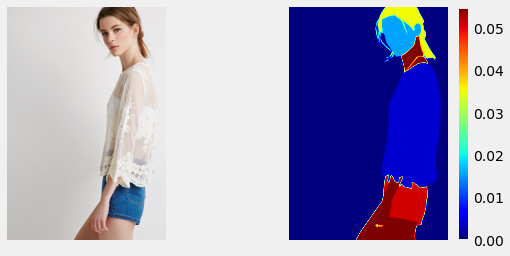

In [9]:
# Display the sample image
sample_image = clothes_images[SAMPLE_IMAGE]
sample_mask = clothes_masks[SAMPLE_IMAGE]

# Plot configuration
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(8,4))
plt.subplots_adjust(wspace=0.5, hspace=0.1)

# Display image and mask
image_1 = imread(sample_image)
image_2 = imread(sample_mask)
plt_1 = ax1.imshow(image_1)
ax1.axis('off')
plt_2 = ax2.imshow(image_2, cmap='jet')
ax2.axis('off')
plt.colorbar(plt_2, ax=ax2)
plt.show()

We split the data into training, validation, and test subsets in the proportions of 80/18/2.<br>

In [10]:
# Split data as training, validation and test set into 80/18/2 ratio
def split_data(image_list, mask_list):
    
    # Split the whole data 80/20 into train and validation sets
    train_images, val_images, train_masks, val_masks = train_test_split(image_list, mask_list, test_size=0.1, random_state=RANDOM_STATE)
    
    # Split the validation data 18/2 into validation and test sets
    val_images, test_images, val_masks, test_masks = train_test_split(val_images, val_masks, test_size=0.05, random_state=RANDOM_STATE)

    print(" Training dataset: ", len(train_images), "\n", "Validation dataset: ", len(val_images), "\n", "Test dataset: ", len(test_images))

    return train_images, val_images, test_images, train_masks, val_masks, test_masks

Our sample image's mask has a certain number of unique labels between 0 and 15, inclusive.<br>

Unique labels in the mask: [ 0.  1.  4.  7.  9. 13. 14.]


Total number of unique labels in the mask: 7





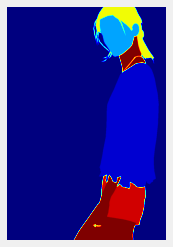

In [11]:
# Check labels for a single mask
def check_sample_mask_label(mask):

    # Read sample mask
    test_mask_png = imread(mask)
    
    # Display sample mask
    plt.imshow(test_mask_png, cmap='jet')
    plt.axis('off')
    
    # Show labels in the sample mask
    img_unique_labels = np.unique(test_mask_png)
    print(f"Unique labels in the mask: {img_unique_labels*255}")
    print("\n")
    
    # Show the total number of labels in the mask
    len_img_unique_labels = len(img_unique_labels)
    print(f"Total number of unique labels in the mask: {len_img_unique_labels}")
    
check_sample_mask_label(clothes_masks[SAMPLE_IMAGE])
print("\n\n")

We already know the total number of classes (unique labels) in the dataset but for the sake of applicability to any other data, the following code learns how many unique labels (classes) exist in a given image dataset.<br>

In [12]:
# Check labels for all masks
def check_mask_labels(masks):
    
    # Create an empty set
    unique_labels_set = set()
    
    # Iterate over all mask dataset
    for mask in masks:
        
        # Read mask
        test_mask = imread(mask)
        
        # Find unique labels in the mask
        unique_labels = np.unique(test_mask)
        
        unique_labels_set.update(unique_labels)

    # Find the maximum label length
    label_len = len(unique_labels_set)
    
    # Convert to list and sort
    unique_labels_list = list(unique_labels_set)
    unique_labels_list.sort()
    unique_labels_list = [int(e*255) for e in unique_labels_list]
    
    # Print results
    print(f" Unique labels across all masks: {unique_labels_list} \n Total number of labels: {label_len}")

    return label_len

# Actual number of classes
CCP_NUM_CLASSES = check_mask_labels(clothes_masks)
# CCP_NUM_CLASSES = 16

 Unique labels across all masks: [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15] 
 Total number of labels: 16


Data augmentation code is adapted from various sources [[10]](https://www.kaggle.com/code/rajkumarl/get-started-with-semantic-segmentation/notebook), [[11]](https://www.tensorflow.org/tutorials/images/data_augmentation), [[12]](https://www.tensorflow.org/api_docs/python/tf/image/adjust_contrast) and can work with DeepLabV3+. One who uses all the augmentation techniques can enlarge the training data seven times. Since we have 13,752 items, they are enough to train the segmentation model, thus we won't need to use those techniques. 

Authors of DeepLabV3+ paper[[13]](https://arxiv.org/pdf/1802.02611.pdf) evaulate models on the PASCAL VOC 2012 semantic segmentation benchmark which contains 20 foreground object classes and one background class. Their dataset includes 1,464, 1,449, and 1,456 items in the training, validation, and test subsets, respectively, totaling 4,369 images. They augment the dataset resulting in 10,582 (trainaug) training images. Our dataset is three times as large as their original data and with 16 classes only (actually nine as mentioned above), leaving no need for augmentation.<br>

However, when the data is too little to train the model, one can refer to the augmentation code below.<br>

In [13]:
# Adjust brightness of image, don't alter in mask
def adjust_brightness(image, mask):
    
    image = tf.image.adjust_brightness(image, 0.3)
    
    return image, mask


# Adjust saturation of image, don't alter in mask
def adjust_saturation(image, mask):
    
    image = tf.image.adjust_saturation(image, 3)
    
    return image, mask


# Adjust hue of image, don't alter in mask
def adjust_hue(image, mask):
    
    image = tf.image.adjust_hue(image, -0.3)
    
    return image, mask


# Flip both image and mask identically
def flip_horizontal(image, mask):
    
    image = tf.image.flip_left_right(image)
    mask = tf.image.flip_left_right(mask)
    
    return image, mask


# Flip both image and mask identically
def flip_vertical(image, mask):
    
    image = tf.image.flip_up_down(image)
    mask = tf.image.flip_up_down(mask)
    
    return image, mask


# Rotate both image and mask identically
def rotate(image, mask):
    
    image = tf.image.rot90(image)
    mask = tf.image.rot90(mask)
    
    return image, mask


# Crop both image and mask identically
def crop(image, mask):
    
    # Crop and resize
    image = tf.image.central_crop(image, 0.5)
    image = tf.image.resize(image, (IMAGE_SIZE,IMAGE_SIZE))
    
    mask = tf.image.central_crop(mask, 0.5)
    mask = tf.image.resize(mask, (IMAGE_SIZE,IMAGE_SIZE))
    
    return image, mask

In [14]:
# Data augmentation
def augment_data(train_ds_for_aug, base_train_dataset):
    
    # Functions to use to augment the image dataset
    augmentation_funcs = [adjust_brightness, adjust_saturation, adjust_hue, flip_horizontal, flip_vertical, rotate, crop]

    for augmentation_func in augmentation_funcs:

        # Augment image and mask pair
        augmented_train_ds = train_ds_for_aug.map(augmentation_func)
        
        # Concatenate every new augmented sets
        base_train_dataset = base_train_dataset.concatenate(augmented_train_ds)

    return base_train_dataset

With or without augmentation, the preparation code[[14]](https://keras.io/examples/vision/deeplabv3_plus/) reads, transforms, resizes the data (train, val, test), and creates a dataset for DeepLabV3+. We keep the image size 512 x 512 as the model employs crop size to be 513 during both training and test. Large crop size is necessary for atrous convolution with large rates to be effective, and so the filter weights are not applied to the padded zero region[[15]](https://arxiv.org/pdf/1706.05587v3.pdf), [[16]](https://arxiv.org/pdf/1802.02611.pdf). Original image size of our dataset well allows for such a crop ratio.<br>

In [15]:
# Read and transform images    
def read_image(image_path, mask=False):
    
    if tpu:
        # For TPU only (Use thıs!)
        with open(image_path, "rb") as local_file:
            image_str = local_file.read()
    else:   
        # Non-TPU case
        image_str = tf.io.read_file(image_path)

    if mask:
        image = tf.image.decode_png(image_str, channels=1) # Decode a PNG-encoded image to a uint8 or uint16 tensor.
        image.set_shape([None, None, 1])
        image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
    else:
        image = tf.image.decode_jpeg(image_str, channels=3) # Decode a JPEG-encoded image to a uint8 tensor.
        image.set_shape([None, None, 3])
        image = tf.image.resize(images=image, size=[IMAGE_SIZE, IMAGE_SIZE])
        image = image / 127.5 - 1
    
    return image


# Load data
def load_data(image_list, mask_list):
    
    # Raw images
    image = read_image(image_list)
    
    # Masks
    mask = read_image(mask_list, mask=True)
    
    return image, mask
  
    
# Create a dataset  
def make_dataset(image_list, mask_list):
    
    # Create dataset
    dataset = tf.data.Dataset.from_tensor_slices((image_list, mask_list))
    
    # Load data
    dataset = dataset.map(load_data, num_parallel_calls=AUTOTUNE)
    
    return dataset
    
    
# Augment and batch a dataset  
def create_seg_dataset(image_list, mask_list, augmentation=False):
    
    dataset = make_dataset(image_list, mask_list)
    
    # Augment dataset
    if augmentation:
        dataset = augment_data(dataset, base_train_dataset)
    
    # Batches
    dataset = dataset.batch(BATCH_SIZE, drop_remainder=True)
    dataset = dataset.prefetch(buffer_size=AUTOTUNE)
    
    return dataset

In [16]:
# Split data as training, validation and test set into 80/18/2 ratio
train_images, val_images, test_images, train_masks, val_masks, test_masks = split_data(clothes_images, clothes_masks)

# If training is necessary
if TRAIN == 1: 
    
    # Basic dataset before augmentation
    base_train_dataset = make_dataset(train_images, train_masks)
    
    # Augmented train dataset
    train_dataset = create_seg_dataset(train_images, train_masks, augmentation=False)
    
    # Unaugmented validation dataset
    val_dataset = create_seg_dataset(val_images, val_masks)
    
    del base_train_dataset

    print("Train Dataset:", train_dataset)
    print("Val Dataset:", val_dataset)
    print("\n")
    print("Size of augmented training dataset: ", train_dataset.__len__().numpy())
    print("Size of validation dataset: ", val_dataset.__len__().numpy())

 Training dataset:  12376 
 Validation dataset:  1307 
 Test dataset:  69


As for now, we have 12,376 items in the training set, 1,307 in the validation, and 69 in the test dataset; all prepared to be fed into DeepLabV3+.<br>

## 3. Semantic Image Segmentation with DeepLabV3+

There are several image semantic segmentation algorithms such as Feature Pyramid Network (FPN), U-Net, SegNet, ParseNet, Mask R-CNN, and DeepLabv3+. In this competition, it makes sense to use DeepLabv3+.<br>

DeepLab combines spatial pyramid pooling, encoder-decoder architecture and atrous convolution. It applies atrous convolutions to the higher block of ResNet few times, each at a different dilation rate, concatenates them and then upsamples the output[[17]](https://arxiv.org/pdf/1706.05587v3.pdf). This is how we can define it in short. A more detailed explanation with the code and model summary follows later on.<br>

<h3 style="color: #6A006A; text-align: center">Figure-3: DeepLabV3+ Architecture</h3><br>

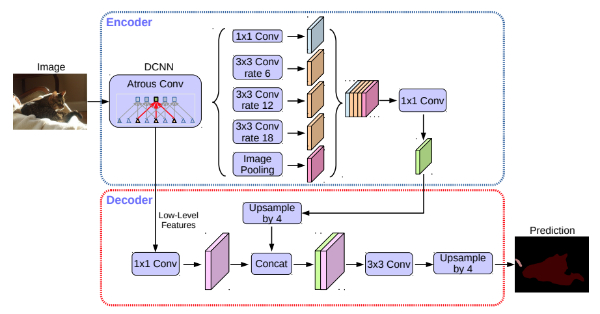
<div align="center"><font size="2">Image source: </font></div><a href="https://arxiv.org/pdf/1802.02611.pdf"><p style="text-align:center">[18]</p></a>

The First DeepLab model came out in 2015, and after several improvements with three newer versions, the latest one, DeepLabv3+, entered the scene in 2018[[19]](https://ai.googleblog.com/2018/03/semantic-image-segmentation-with.html).<br>

DeepLabV3+ exploits contextual information by using spatial pyramid pooling and encoder-decoder structure. DeepLabV3+ has three main components: 1) The ResNet-101 architecture, 2) atrous convolutions, and 3) Atrous Spatial Pyramid Pooling (ASPP)[[20]](https://sthalles.github.io/deep_segmentation_network/)<br>

While the authors of DeepLabV3+ employed Xception and ResNet-101 as the network backbones[[21]](https://arxiv.org/pdf/1802.02611.pdf), that idea would be an overkill for our task. The authors suggest that one could apply the framework to any network[[22]](https://arxiv.org/pdf/1706.05587v3.pdf). Therefore, we will use ResNet-50 to avoid computational intensity. ResNet-50 is a convolutional neural network that is 50 layers deep.<br>

Atrous convolutions, a.k.a dilated convolutions, introduce a new parameter named dilation rate, which defines a spacing between the values in a kernel. A standard 3x3 filter is rate=1 atrous convolution. A 3x3 kernel with a dilation rate of 2 will have the same field of view as a 5x5 kernel, while only using nine parameters. When we expand the filter dilating at rate=2, we create a kernel like 5x5 but fill the empty spaces with zero. Thus, we can get a 3x3 kernel with a dilation rate of 2 if we delete every second column and row in a 5x5 kernel[[23]](https://towardsdatascience.com/types-of-convolutions-in-deep-learning-717013397f4d). Increasing the atrous rate, we create more sparse filters that capture features from multi-scale context. Unlike encoder-decoder models, downsampling doesn't occur in spatial pyramid pooling[[24]](https://sthalles.github.io/deep_segmentation_network/).<br>

The model takes (512, 512, 3) image size as input. ResNet50 trains the image and outputs features from the layer *conv4_block6_2_relu*. This layer is in the fourth stage of the 5-stage network and sends high-level features out, which we may call "*resnet-1 output*," which is 32x32x256. Another output from ResNet50 comes from the *conv2_block3_2_relu*, a second stage, low-level feature map, and we may call it "*resnet-2 output*," which is 128x128x64. Unlike encoder-decoder frameworks such as U-Net, SegNet, DeepLabV3+ makes only two connections from the encoder to the decoder. One carries the high-level, and the other carries the low-level features.<br>

DeepLabV3+ applies various atrous convolutions at rates 1, 6, 12, and 18. As Figure-4 suggests, these are large convolutions (except the first one) where weights are far from each other and learn from a larger view of the input feature map. Varying dilation rates also allow for such learning to occur at distinct scales. It is like looking at *The Coronation of Napoleon*, a painting by *Jacques Louis David*, which is almost 10 meters (33 ft) wide by a little over 6 meters (20 ft) tall[[25]](https://en.wikipedia.org/wiki/The_Coronation_of_Napoleon). You look at the picture at different perpendicular distances, and at each one, pay attention to a group of distinct spots on it. Those groups, every time, represent a broader field of view. Since you cannot encompass this huge artwork, you move horizontally and vertically with the aid of a two-leg ladder. Every traverse and distance point will provide you with varying scales of contextual information about the picture.<br>

<h3 style="color: #6A006A; text-align: center">Figure-4: Atrous Convolutions</h3><br>

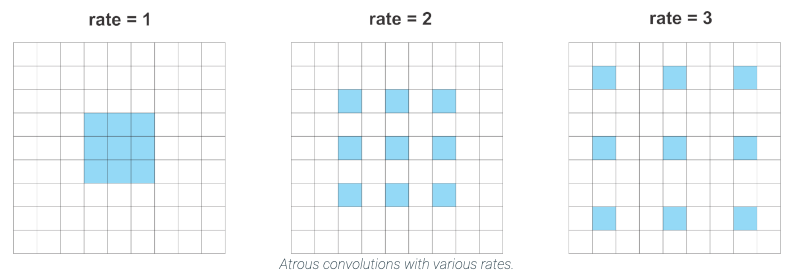<br>
<div align="center"><font size="2">Image source: </font></div><a href="https://sthalles.github.io/deep_segmentation_network/"><p style="text-align:center">[26]</p></a>

Spatial pyramid pooling exposes the *resnet-1* output to atrous convolutions with kernel sizes 1x1 and 3x3. The operation keeps the dimension (256) and the input size (32, 32). A parallel implementation is image pooling. Since the pool size is the input size, that performs global pooling and reduces the dimension to 1x1x256, and the convolution block keeps the size as 1x1x256. An upsampling converts it back to *conv4_block6_2_relu* size, 32x32x256. Then, we concatenate (see the encoder in Figure-3) all the five outputs of the spatial pyramid pooling creating a 32x32x1280 feature map. As a last encoding step, we apply 1x1 convolution to the output and reduce the dimension to 256, ending up with 32x32x256. That is the transformed *resnet-1* output (see *conv2d_5* in the summary below) which has collected high-level features.<br>

We apply a convolution 1x1 to *resnet-2* output that has the size of 128x128x64 and low-level features and reduce the dimension to 48 while keeping the size (128x128x48). Now, it's time to concatenate *resnet-1* and *resnet-2*, but we need to upsample the former by four since the sizes don't match. The resulting dimension will be 256+48=304, and the size is 128x128x304 (*concatenate_1*). Now, we have high and low features together.<br>

A double convolution to the concatenated output will produce an 128x128x256 feature map (reducing the dimension from 304 to 256). Upsampling by four will create an output of 512x512x256. The final convolution 1x1 will output 512x512x16 (*conv2d_9*), where 16 is the number of classes.<br>

One can see the whole DeepLabV3+ model summary later below.<br>

In [17]:
def convolution_block(block_input, num_filters=256, kernel_size=3, dilation_rate=1, padding="same", use_bias=False, activation="relu"):
    
    x = Conv2D(
            num_filters,
            kernel_size=kernel_size,
            dilation_rate=dilation_rate,
            padding="same",
            use_bias=use_bias,
            kernel_initializer=keras.initializers.HeNormal()
        )(block_input)
    x = BatchNormalization()(x)
    x = Activation(activation)(x)
    
    return x


def dilated_spatial_pyramid_pooling(dspp_input):
    
    shape = dspp_input.shape
    print("shape: ", shape)
    
    # Image Pooling
    x = AveragePooling2D(pool_size=(shape[1], shape[2]))(dspp_input)
    x = convolution_block(x, kernel_size=1, use_bias=True)
    out_pool = UpSampling2D(size=(shape[1], shape[2]), interpolation="bilinear")(x)

    # 1x1 conv
    out_1 = convolution_block(dspp_input, kernel_size=1, dilation_rate=1)
    
    # 3x3 conv rate=6
    out_6 = convolution_block(dspp_input, kernel_size=3, dilation_rate=6)
    
    # 3x3 conv rate=12
    out_12 = convolution_block(dspp_input, kernel_size=3, dilation_rate=12)
    
    # 3x3 conv rate=18
    out_18 = convolution_block(dspp_input, kernel_size=3, dilation_rate=18)

    # Concatenate
    x = Concatenate(axis=-1)([out_pool, out_1, out_6, out_12, out_18])
    
    # 1x1 conv
    output = convolution_block(x, kernel_size=1)
    
    return output


def deeplab_v3_plus(image_size, num_classes):
    
    # Input 
    inputs = Input(shape=(image_size, image_size, 3))
    
    # Encoder
    resnet50 = ResNet50(weights="imagenet", include_top=False, input_tensor=inputs)
    x = resnet50.get_layer("conv4_block6_2_relu").output
    x = dilated_spatial_pyramid_pooling(x)

    # Decoder
    input_a = UpSampling2D(size=(4, 4), interpolation="bilinear")(x)
    input_b = resnet50.get_layer("conv2_block3_2_relu").output
    input_b = convolution_block(input_b, num_filters=48, kernel_size=1)
    
    # Concatenate
    x = Concatenate(axis=-1)([input_a, input_b])
    
    # 3x3 conv rate=1
    x = convolution_block(x)
    x = convolution_block(x)
    
    # Upsample to the original size
    x = UpSampling2D(size=(4, 4), interpolation="bilinear")(x)
    
    output = Conv2D(num_classes, kernel_size=(1, 1), padding="same")(x)
    
    model = Model(inputs=inputs, outputs=output)
    
    return model

DeepLabV3+ architecture is derived and adapted from [[27]](https://keras.io/examples/vision/deeplabv3_plus/), [[28]](https://github.com/nikhilroxtomar/Human-Image-Segmentation-with-DeepLabV3Plus-in-TensorFlow).

In [18]:
# Plot model history
def plot_history(y_data, x_data, titles, x_label, y_labels):
    
    # Four subplots
    f, axes = plt.subplots(nrows=2, ncols=2, sharex=True, figsize=(13,9))
    plt.subplots_adjust(wspace=0.3, hspace=0.3)   
    
    # Set title, x and y labels, and line plot for each subplot
    axes[0,0].set_title(titles[0], fontsize=15)
    axes[0,0].plot(x_data, y_data[0])
    axes[0,0].set_ylabel(y_labels[0])

    axes[0,1].set_title(titles[1], fontsize=15)
    axes[0,1].plot(x_data, y_data[1])
    axes[0,1].set_ylabel(y_labels[1])

    axes[1,0].set_title(titles[2], fontsize=15)
    axes[1,0].plot(x_data, y_data[2])
    axes[1,0].set_xlabel(x_label)
    axes[1,0].set_ylabel(y_labels[2])

    axes[1,1].set_title(titles[3], fontsize=15)
    axes[1,1].plot(x_data, y_data[3])
    axes[1,1].set_xlabel(x_label)
    axes[1,1].set_ylabel(y_labels[3])

    plt.show()

Model details are explained below:

In [19]:
# Create DeepLabV3+ model for image segmentation
def create_model():

    # Model
    model = deeplab_v3_plus(image_size=IMAGE_SIZE, num_classes=CCP_NUM_CLASSES)
    
    # Model summary
    model.summary()
    # keras.utils.plot_model(model, show_shapes=True)
    print("\n")
    
    # SparseCategoricalCrossentropy as it is a classification of pixels with sparse output vector
    loss = keras.losses.SparseCategoricalCrossentropy(from_logits=True)
    
    # Model; clip gradients to avoid exploding just in case. Adam as optimizer for faster convergence. 
    # Accuracy as metric as it is a classification problem.
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=LR, clipnorm=1.0), loss=loss, metrics=["accuracy"])
    
    return model

In [20]:
%%time

# If training is necessary
if TRAIN == 1:
    
    dl_model = create_model()

    # Extra: best model saving. We monitor validation loss as the monitoring metric. 
    # Save the model at the end of each epoch and the one where the validation loss reaches minimum.
    dl_checkpoint_filepath = './models/deeplabv3plus_checkpoint'
    dl_model_checkpoint_callback = ModelCheckpoint(filepath=dl_checkpoint_filepath, 
                                                   monitor='val_loss', 
                                                   verbose=0,
                                                   save_best_only=True, 
                                                   save_weights_only=True, 
                                                   mode='min', 
                                                   save_freq='epoch')
    
    # Train
    history = dl_model.fit(train_dataset, validation_data=val_dataset, epochs=EPOCHS, callbacks=[lr_scheduler, dl_model_checkpoint_callback], verbose=1)
    
    # Save the model (latest)
    dl_filename_h5 = 'deeplabv3plus_model.h5'
    dl_model.save('./models/' + dl_filename_h5)
    
    # Plot the results
    hist = history.history
    
    # Loss and accuracy values
    y_data = [hist["loss"], hist["accuracy"], hist["val_loss"], hist["val_accuracy"]]
    x_data = list(range(EPOCHS))

    # Subplot titles
    titles = ["Training Loss", "Training Accuracy", "Validation Loss", "Validation Accuracy"]   

    # Subplot axis labels
    x_label = "Epoch"
    y_labels = ["Train loss", "Train accuracy", "Val loss", "Val accuracy"]

    # Plot
    plot_history(y_data, x_data, titles, x_label, y_labels)
    
else:
        
    # Load the latest model. It can be used to reconstruct the latest model identically.
#     reconstructed_dl_model = load_model("../input/socks-images-deeplabv3plus-inceptionv3/deeplabv3plus_model.h5")

    # Load the best model saved
#     checkpoint_path = "../input/socks-images-deeplabv3plus-inceptionv3/best_model/best_model/deeplabv3plus_checkpoint"
    checkpoint_path = "../input/socks-images-deeplabv3plus-inceptionv3/deeplabv3plus_best_model/deeplabv3plus_checkpoint"
                        
    reconstructed_dl_model = create_model()

    # Load the weights
    reconstructed_dl_model.load_weights(checkpoint_path)

94781440/94765736 [==============================] - 1s 0us/step
shape:  (None, 32, 32, 256)
Model: "model"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_1 (InputLayer)            [(None, 512, 512, 3) 0                                            
__________________________________________________________________________________________________
conv1_pad (ZeroPadding2D)       (None, 518, 518, 3)  0           input_1[0][0]                    
__________________________________________________________________________________________________
conv1_conv (Conv2D)             (None, 256, 256, 64) 9472        conv1_pad[0][0]                  
__________________________________________________________________________________________________
conv1_bn (BatchNormalization)   (None, 256, 256, 64) 256         conv1_conv[0][0]                 
_

One can train the model with the same or different hyperparameters, but we will use the trained and saved model not to wait for long. The saved model has a good accuracy.<br>
<br>
The last layer in the model summary shows 16 classes. However, we use only nine labels in practice for this example. Therefore, our predicted masks will show nine distinct pixel assignments.<br>
<br>
We created and ran the model. Now, we can predict the test images. We'll do it for 5 images only as a showcase.<br>

Cleanup called...


test input shape:  (512, 512, 3)
expanded test input shape:  (1, 512, 512, 3)
predicted mask shape:  (1, 512, 512, 16)
predicted mask reduced shape:  (512, 512, 16)
prediction shape:  (512, 512)




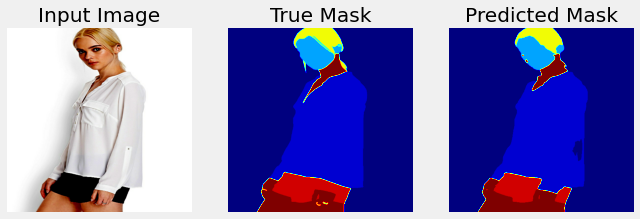

Cleanup called...


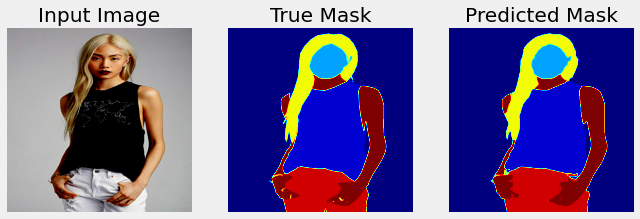

Cleanup called...


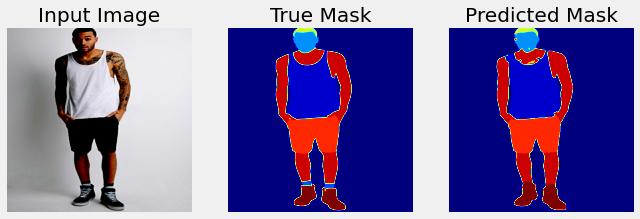

Cleanup called...


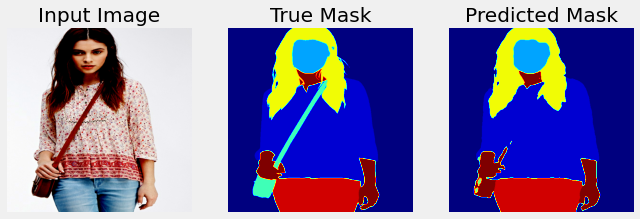

Cleanup called...


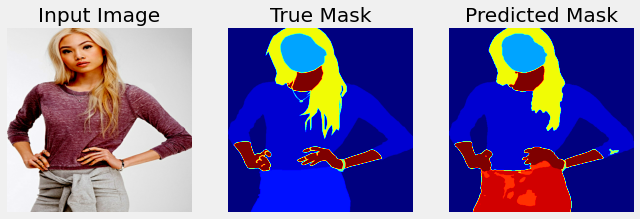

In [21]:
# Predict mask
def predict_mask(test_input, reconstructed_dl_model, i):
    
    # Add dimension at axis=0
    expanded_test_input = np.expand_dims((test_input), axis=0)
    
    # Predict mask with probs
    predicted_mask= reconstructed_dl_model.predict(expanded_test_input)
    
    # Reduce dimension
    predicted_mask_red = np.squeeze(predicted_mask)
    
    # Predict the most likely
    prediction = np.argmax(predicted_mask_red, axis=2)
    
    # Noticing dimensions
    if i == 0:
        print("test input shape: ", test_input.shape)
        print("expanded test input shape: ", expanded_test_input.shape)
        print("predicted mask shape: ", predicted_mask.shape)
        print("predicted mask reduced shape: ", predicted_mask_red.shape)
        print("prediction shape: ", prediction.shape)
        print("\n")
        
    return prediction


# Display images and masks
def display_imgs(display_list):
    
    plt.figure(figsize=(10, 10))
    
    titles = ["Input Image", "True Mask", "Predicted Mask"]
        
    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(titles[i])
        plt.imshow(display_list[i], cmap='jet')
        plt.axis('off')
    plt.show()


# Plot prediction
def plot_prediction(reconstructed_dl_model, test_images, masks=None):
    
    predictions = []
    
    for i, (test_image, test_mask) in enumerate(zip(test_images, masks)):
        
        # Read test image and mask
        test_input_image = read_image(test_image, mask=False)
        test_input_mask = read_image(test_mask, mask=True)
        
        # Predict mask
        prediction = predict_mask(test_input_image, reconstructed_dl_model, i)
        predictions.append(prediction)
               
        # Display image        
        display_imgs([test_input_image, test_input_mask, prediction])
        
    return predictions


# We'll use 5 test images only
if TRAIN == 1:
    predictions = plot_prediction(dl_model, test_images[:5], masks=test_masks[:5])
else:
    predictions = plot_prediction(reconstructed_dl_model, test_images[:5], masks=test_masks[:5])

Pictures also show that the model outputs highly accurate results. All images and masks are of the shape of 512x512.<br>
<br>
Once the model has predicted pixels for each clothing type, we can proceed to the next stage of our cycle. Since we are interested in grouping products by pattern design, we only need a particular sort of clothing at a time and a small segment of it. The entire garment is not necessary; a patch will be sufficient.<br>

## 4. Patch Extraction

This stage involves six small steps that I will try to explain following the below code.<br>

In [22]:
# Hide axes
def hide_axes(this_ax):
    this_ax.set_frame_on(False)
    this_ax.set_xticks([])
    this_ax.set_yticks([])
    return this_ax


# Display random samples of images  
def display_images(ax, title, image):

    ax.imshow(image)
    ax.set_title(title, fontsize=13)
    ax.axis('off')
       

# Display images
def display_test_images(images, cols=3):

    # Plot parameters
    len_images = len(images) # no of images
    rows = math.ceil(len_images / cols) # no of rows
    fig, axes = plt.subplots(nrows=rows, ncols=cols, figsize=(cols*3, rows*3)) # figure size and subplots
    if rows == 1:
        axes = axes.reshape((1, cols))
    plt.subplots_adjust(wspace=0.5, hspace=0.1)
    
    # If there are less images than the number of subplots
    if len_images < rows * cols:
        
        # Find how many subplots will be empty
        len_empty_axes = (rows * cols) - len_images
        
        # Hide the empty subplots
        for col in range(len_empty_axes):
            
            # Hide redundant axes
            hide_axes(axes[rows-1, (cols-len_empty_axes+col)])

    # Display
    for i, img in enumerate(images):
        p_row = (i // cols) # get the row 
        p_col = (i % cols) # get the column
        this_ax = axes[p_row, p_col] # subplot for the image
        title = str(i+1)
        display_images(this_ax, title, img)

In [23]:
# Get mask values
def get_mask_labels(file):

    # Create an empty dictionary
    dict_labels_csv = {}

    # Read csv file row-by-row, and enter columns as key and value
    with open(labels_csv, mode='r') as input:
        reader = csv.reader(input)
        dict_labels_csv = {rows[1]:rows[0] for rows in reader}

    # Delete the null value key
    dict_labels_csv.pop('label_list', None)
    
    # Convert to pandas dataframe
    dict_labels_csv = {"Name": list(dict_labels_csv.keys()), "Label": list(dict_labels_csv.values())}
    labels_df = pd.DataFrame.from_dict(dict_labels_csv)
    print("Categories of Clothes")
    display(labels_df)
    print("\n")

    return dict_labels_csv


# Find relevant masks where a particular label exists
def find_masks_by_label(searched_label, images, masks):
    
    # Create an empty list
    found_images = []
    found_masks = []
    
    # Iterate over the predicted masks
    for image, mask in zip(images, masks):
        
        # Find unique labels in a mask
        unique_img_labels = np.unique(mask)
        
        # Check if the label being searched exists in the mask
        if searched_label in unique_img_labels:
            
            # If exists, append the mask and the image to the lists
            found_images.append(image)
            found_masks.append(mask)
            
    return found_images, found_masks


# Find the longest consecutive x and consecutive y locs
def find_longest_loc_array(locs):
    
    # Group the items into subsequences using itertools.groupby based on constant differences from an increasing count
    c = count()
    longest_list = max((list(value) for _, value in groupby(locs, lambda x: x-next(c))), key=len)
    
    return longest_list


# Reduce the kernel size
def reduce_kernel(kernel):
    
    # Delete the first row
    new_kernel = np.delete(kernel, 0, 0)
    
    # Delete the first column
    new_kernel = np.delete(new_kernel, 0, 1)
    
    return new_kernel


# Create the initial square kernel
def create_initial_kernel(relevant_area_width, relevant_area_length) :
    
    # If the width is longer than the length, shorten the width to make it equal to the length
    if relevant_area_width >= relevant_area_length:
        relevant_area_width = relevant_area_length
        
    # If the length is longer than the the width, shorten the length to make it equal to the width
    else:
        relevant_area_length = relevant_area_width
        
    # All weights in the kernel will be 1. This will be a square kernel.
    initial_kernel = np.ones((relevant_area_width, relevant_area_length))
        
    return initial_kernel


# Hot-encode the mask and create an initial square kernel
def encode_mask(longest_x_locs, longest_y_locs, mask_searched, searched_label):
    
    # Find the lowest and highest x, y coordinates
    lowest_x = min(longest_x_locs)
    lowest_y = min(longest_y_locs)
    highest_x = max(longest_x_locs)
    highest_y = max(longest_y_locs)
       
    # Relevant area size. This is the maximum area in which we should look for
    # a patch that involves pixels belonging to only the searched label.
    relevant_area_width = highest_x - lowest_x + 1
    relevant_area_length = highest_y - lowest_y + 1
       
    # If any dimension is less than four pixels, it's better not working on it. 
    if relevant_area_width < 4 and relevant_area_length < 4:
        print("Area is very or too small to apply convolution and extract a patch but let's give a try!")
        
    """ Hot-encode the mask; value is 1 where the searched label exists, otherwise 0.
    Since "some label" is labeled as 1 too, we first need to encode the pixels of the
    searched label as 100 and all other pixels as 0. Then, we change encoding 100 to 1,
    making all pixels as either 0 or 1."""
    mask_encoded = np.where(mask_searched == searched_label, 100, mask_searched)
    mask_encoded = np.where(mask_encoded != 100, 0, mask_encoded)
    mask_encoded = np.where(mask_encoded == 100, 1, mask_encoded)
        
    # Create an initial square kernel close in size to the relevant area.
    kernel = create_initial_kernel(relevant_area_width, relevant_area_length) 
            
    return mask_encoded, kernel, lowest_x, lowest_y, highest_x, highest_y


# Similar to CNN, the kernel moves over the mask but to find the largest homogeneous sub-area.
def apply_convolution(mask_encoded, kernel, lowest_x, lowest_y, highest_x, highest_y):
    
    shape = kernel.shape[0]
    threshold_value = shape * shape
    area_calculated = None
    x_coors = None
    y_coors = None
        
    for r in range(lowest_x, highest_x + 1 - shape):
        for c in range(lowest_y, highest_y + 1 - shape):
            
            # Apply filter
            convolved_area = mask_encoded[r:r+shape, c:c+shape]
            
            # Calculate the area
            area_calculated = np.sum(np.multiply(convolved_area, kernel))
            
            # Get the x, y coordinates of the largest homogeneous area
            if area_calculated == threshold_value:
                               
                # The largest area's x-ccordinates
                x_coors = [r, r+shape]
                
                # The largest area's y-ccordinates
                y_coors = [c, c+shape]
                
                break
        else:
            continue
        break
                
    return x_coors, y_coors, area_calculated, threshold_value


def resize_image(image):
    
    resized_image = tf.image.resize(
                    images=image,
                    size=[IMAGE_SIZE, IMAGE_SIZE],
                    method=tf.image.ResizeMethod.NEAREST_NEIGHBOR,
                    preserve_aspect_ratio=False,
                    antialias=False,
                    name=None
    )
    return resized_image
         
        
def find_label_location(original_images, masks, searched_label, file):

#     # Import csv file and convert to dictionary
#     dict_labels_csv = get_mask_labels(file)

# https://thispointer.com/find-the-index-of-a-value-in-numpy-array/
#     # Find the label of the searched item in the dictionary
#     index = list(dict_labels_csv["Name"]).index(searched_item)
#     searched_label = int(list(dict_labels_csv["Label"])[index])
    print("Searched label: ", searched_label)
    print("\n")       

    # Find relevant images/masks where a particular label exists
    images_searched, masks_searched = find_masks_by_label(searched_label, original_images, masks)
    
    if not masks_searched:
        print("Type of clothes you indicated does not exist in the images provided!")
        return None
    
    else:
        # Find and crop label segment from the original image
        cropped_segments = []

        n = 1

        for image_searched, mask_searched in list(zip(images_searched, masks_searched))[0:5]:

            # Get the x and y coordinates of the label segment in the image/mask
            coordinates = np.where(mask_searched == searched_label)

            # Separate the x and y coordinates 
            x_locs = sorted(list(set(coordinates[0])))
            y_locs = sorted(list(set(coordinates[1])))

            # Find the longest consecutive x locs and consecutive y locs
            longest_x_locs = sorted(find_longest_loc_array(x_locs))
            longest_y_locs = sorted(find_longest_loc_array(y_locs))           
                                
            # Hot-encode the mask and create an initial square kernel
            mask_encoded, kernel, lowest_x, lowest_y, highest_x, highest_y = encode_mask(longest_x_locs, 
                                                                            longest_y_locs, mask_searched, searched_label)
            
            # Move over the mask with the kernel and get the largest square homogenous 
            # area where each pixel is labeled with the searched label.
            for i in range(kernel.shape[0]-1):
                x_coors, y_coors, area_calculated, threshold_value = apply_convolution(mask_encoded, kernel, lowest_x, 
                                                                                       lowest_y, highest_x, highest_y)
            
                # Check if a homogeneous area exists. 
                # Homogeneous area occurs when the area calculated is equal to the threshold value.
                if area_calculated != threshold_value:
                    kernel = reduce_kernel(kernel)
                else:
                    break
                    
            print("area_calculated:", area_calculated, "x_coors:", x_coors, "y_coors:", y_coors)
            
            try:
                # Resize the original image as the predicted mask
                image = mpimg.imread(image_searched)
                resized_image = resize_image(image)
            
                # Crop the label segment in the original image
                cropped_segment = resized_image[x_coors[0]:x_coors[1], y_coors[0]:y_coors[1]]
                cropped_segment = np.array(cropped_segment, dtype=int)
                cropped_segments.append(cropped_segment)
                
                # Filter out empty arrays
                filtered_cropped_segments = list(filter(lambda x: x.tolist(), cropped_segments))
            except:
                pass
        
        # Plotting
        # Convert array to list and enumerate them
        enum_cropped_segments = [x.tolist() for x in cropped_segments]
        enum_cropped_segments = enumerate(enum_cropped_segments)
        # Filter out empty lists
        enum_cropped_segments = list(filter(lambda x: x[1], enum_cropped_segments))
        # Use lists for plotting
        plt_cropped_segments = [x[1] for x in enum_cropped_segments]
        
        # Display cropped label segments
        display_test_images(plt_cropped_segments)

        # Shapes of the images
        print("\n")
        print("Shapes of patch images in order:")
        print({"Image " + str(i+1):(len(enum_cropped_segment), len(enum_cropped_segment)) for i, enum_cropped_segment in enum_cropped_segments})
        print("\n")

        return filtered_cropped_segments


# Find unique labels in masks
def find_unique_labels(masks):
    
    for i, mask in enumerate(masks):
        unique_img_labels = np.unique(mask)
        print(f"Unique labels for mask {i+1}: {unique_img_labels}")
    print("\n")
        
        
# Find unique labels in masks
find_unique_labels(predictions)

Unique labels for mask 1: [ 0  1  4  7  9 13 14]
Unique labels for mask 2: [ 0  1  4  7  9 10 12 13 14]
Unique labels for mask 3: [ 0  1  3  4  7  9 10 13 14 15]
Unique labels for mask 4: [ 0  1  4  7  8  9 12 13 14]
Unique labels for mask 5: [ 0  1  4  7  8  9 12 13 14]




We find the unique labels in five test images. Each label corresponds to one object, i.e., a clothing type, hair, face, or background. Many masks share classes. Also, all labels are consistent across the images.<br>
<br>
As the first step in this stage, we will try a specific label in the first five predicted masks to see which object it corresponds even though we know it from the table. The related object will be in green color. If that label doesn't exist in those five masks, the code will return none. One can try masks other than the five chosen.<br>

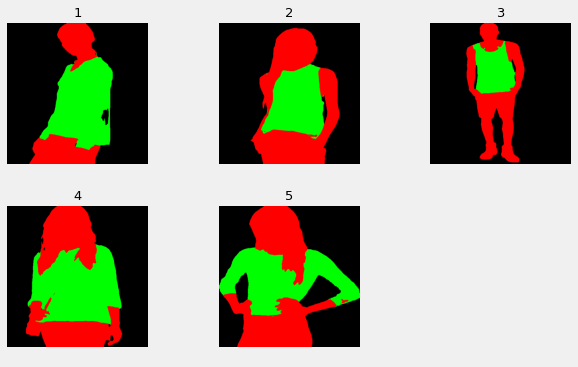

In [24]:
# Find a particular object. An object can be a clothing, hair, face or background. 
# Particular object will be marked in green color.
def find_object(searched_label, sample_prediction):
    
    # Find where (x,y coordinates) the searched label exists in the image array
    target_array = np.where(sample_prediction == searched_label)
    
    # Convert the array to list of x,y coordinates
    target_xys = list(zip(target_array[0], target_array[1]))
    
    # Convert the prediction (mask) into 3-channel image and display it
    dim = np.zeros((IMAGE_SIZE,IMAGE_SIZE))
    rgb_image = np.stack((sample_prediction,dim, dim), axis=2)

    for target_xy in target_xys:
        # x,y coordinates of the searched label
        x,y = target_xy[0], target_xy[1]
        # Change the color of the searched label's pixels into green
        rgb_image[x:x+1, y:y+1] = 0,128,0
        # Display the image

    return rgb_image


# Find the clothing in images
# Number of images to look for a specific clothing
no_samples = 5
# Searched object label (label for clothing)
searched_label = 1
# Store the found images in a list
rgb_images = []
# Find the relevant images and display them
for no_sample in range(no_samples):
    try:
        rgb_image = find_object(searched_label, predictions[no_sample])
        rgb_images.append(rgb_image)
    except:
        pass
display_test_images(rgb_images)
print("\n")

Label 1 represents "top," which could be a shirt, t-shirt, sweater, etc. If you try other labels in the table of Figure-2, which also exist in unique labels for masks, you can see they appear in the masks. But for now, we will focus on pixels assigned to Class 1.<br>
<br>
Pixels labeled by highly accurate models have an integrated, homogeneous form. Let's get away from this ideal case and assume something like in Figure-5 (1), where all green pixels belong to the same class, and those represented in black have other labels. Cartesian coordinates of any pixel in the mainland region fall inside the range shared by all mainland members. For example, the pixel second from the left and fourth from the bottom in (1) looks disconnected, but some mainland members have the same x and y locations. On the other hand, island pixels fall outside this range. We may better define it as such: at least one coordinate of an island pixel is not shared by any mainland pixel whereas coordinates of any mainland pixel are shared by one or more other mainland pixels.<br>

In the second step, `find_masks_by_label` searches and finds the masks by the requested label and `np.where` method in the `find_label_location` gets the x and y coordinates of the pixels (green, island and mainland) of the requested class.<br>

To economize the space, let's assume each square in the figure represents 4x4 pixels. The third step in the second stage obtains the longest consecutive x and y coordinates running `find_longest_loc_array`[[29]](https://stackoverflow.com/questions/44392364/how-to-find-the-longest-consecutive-chain-of-numbers-in-an-array). Arrays do not need to be on the same x or y-axis. Any array of consecutive x and y values, which range from one end of the mainland to the opposite will provide the longest series. The longest arrays are marked red in (2) and provide us with their minimum and maximum x and y values, which we may call "bounding box coordinates."<br>

<h3 style="color: #6A006A; text-align: center">Figure-5: Patch Extraction</h3><br>

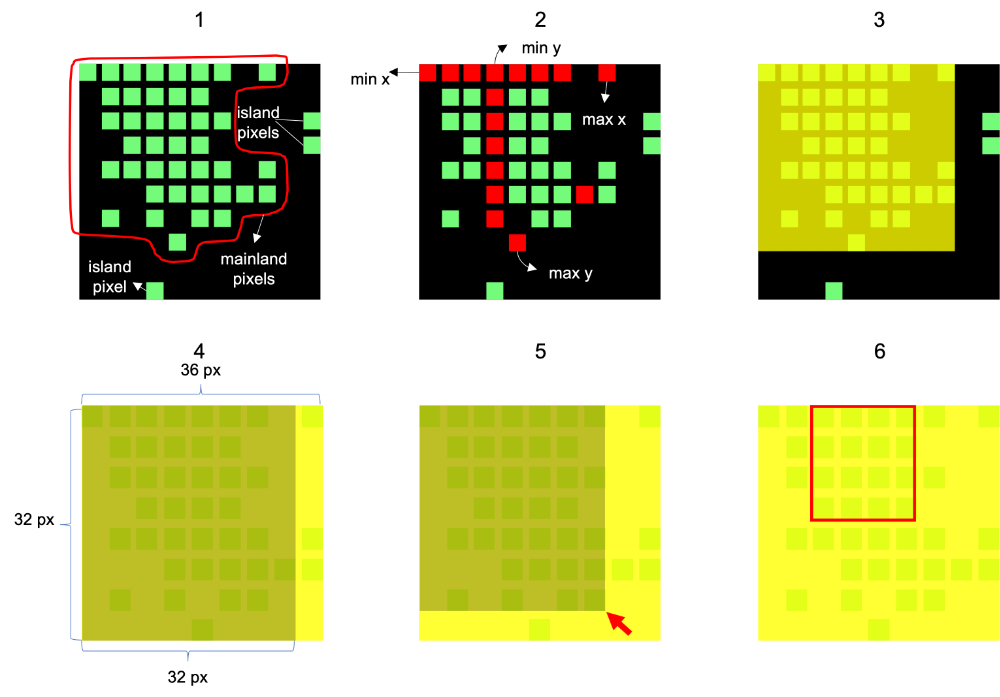<br>
<div align="center"><font size="2">Image by author </font></div>

Bounding box coordinates provide us with the perpendicular borders of the mainland. This is what `encode_box` does. It takes the bounding box coordinates and creates a mask from them as in (3) and determines the "relevant area." The relevant area is the maximum rectangular enclosure of the mainland. The function also converts all mainland pixels' values in the relevant area to 1 and others' to 0 and then creates the initial kernel. The initial kernel will be a square since patches in the neural network models will be cropped to square size. To keep the image proportion, and make a square patch extraction, we need to make sure that the kernel has equal edge lengths. That is initially possible using the shortest side of the relevant area as the size of the kernel. As (4) suggests, the initial size can be 32x32 in our example. All weights in the filter will be 1.<br>

As for the fourth step, we apply a similar convolution logic by `apply_convolution` in which we element-wise multiply kernel values (shaded area) with the corresponding pixels in the relevant area and sum them up. The kernel will traverse with stride=1 and pad=0. We are trying to find the maximum possible region where each pixel is adjacent to the other.  We can achieve it if we get a total sum equal to the multiplication of kernel size, which is 32x32=1024 (calculated area). Such a region is dense. If other-label pixels blends with the target label pixels, the area will become sparse, and the sum will never be 1024. In that case, we will shorten the kernel from one horizontal and one vertical side by 1 pixel as in (5) and start over.<br>

The fifth step runs `reduce_kernel` and iteratively searches for a perfectly dense region (PDR) as in (6). As soon as it finds the PDR, it will stop running. In our example, the kernel could find a PDR of the size 16x16.<br>

The sixth and last step gets the bounding box coordinates of the PDR and crops a segment of the same size as the PDR from the original image after resizing it. Before the cropping operation, the original image should be the same size as the mask for an exact overlap. Finally, we are going to get patches of pattern from all images.<br>

One might think if this patch represents the pattern. If the kernel is large enough and finds a dense area, the answer is yes. If the kernel is reduced a lot, then we already don't have room to worry because any small patch is neither better nor worse than another one. The only option that needs consideration is when the kernel size is medium. It is a fixable issue but goes beyond the scope of this notebook and the patience of its author.<br>

Searched label:  1


area_calculated: 24964.0 x_coors: [250, 408] y_coors: [183, 341]
area_calculated: 26569.0 x_coors: [222, 385] y_coors: [202, 365]
area_calculated: 12544.0 x_coors: [131, 243] y_coors: [173, 285]
area_calculated: 34225.0 x_coors: [232, 417] y_coors: [174, 359]
area_calculated: 14641.0 x_coors: [179, 300] y_coors: [107, 228]


Shapes of patch images in order:
{'Image 1': (158, 158), 'Image 2': (163, 163), 'Image 3': (112, 112), 'Image 4': (185, 185), 'Image 5': (121, 121)}




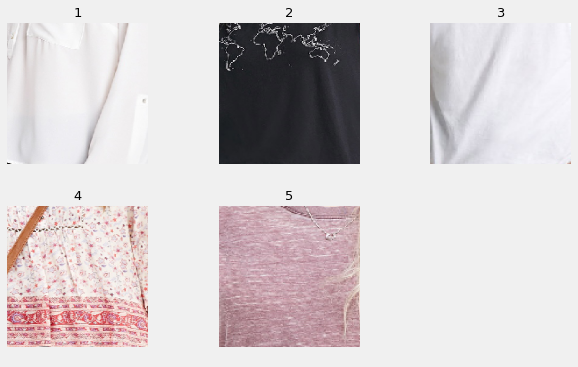

In [25]:
labels_csv = "../input/socks-images-deeplabv3plus-inceptionv3/labels.csv"

# Check for 5 images
cropped_segments = find_label_location(test_images[:5], predictions[:5], searched_label, labels_csv)

We have got patches of "top" clothes and save them. In the rest of the notebook, I will use already saved ones, which are the same. Saved patches are in the patches folder.<br>

To avoid lengthy computation, we used only five images as examples.<br>

Here, we see the area calculated. It is the dense region area size, followed by the bounding box coordinates. All regions are squares but in different sizes depending on the mask. They range from 112x112 to 185x185 pixels. Now, the question is whether this resolution is good enough or not. The answer is the next.<br>

In [26]:
# Save and zip files
def save_and_ouput_file(images, folder_name):

    # Convert images from array to image
    images = [tf.clip_by_value(image, 0, 255) for image in images]
    images = [Image.fromarray(tf.cast(image, tf.uint8).numpy()) for image in images]

    # Save images as png file
    for i in range(len(images)):
        images[i].save(f"{folder_name}/{str(i+1)}.png")

In [27]:
%%capture

# Create a directory if not exists
!mkdir -p patch_images

# Create a folder name to store images
folder_name = "patch_images"

# Save and zip images
try:
    save_and_ouput_file(cropped_segments, folder_name)
    
    # Zip output to load and attach them to the notebook later
    !zip -r patch_images/patches.zip ./
except:
    pass

## 5. Image Enhancement by ESRGAN

We have the patches, yet they are not large enough. We don't know what resolution we will get from patch extraction. If they are above 256, it is sufficient, however, there is no guarantee that it will occur. The recommended size for input images in deep neural networks is 256x256[[30]](https://www.researchgate.net/post/Which_Image_resolution_should_I_use_for_training_for_deep_neural_network/6277d066af031d1f67575dbd/citation/download).<br>

In TensorFlow, we have image transformation before training the samples, yet, we have another option to exploit, and it could even be better: **Enhanced Super-Resolution Generative Adversarial Network (ESRGAN)**.<br>

GAN has different models such as producing new images from images or images from text. As one of such models, ESRGAN converts images from low-resolution to high-resolution, and enhancement can be four times enlargement.<br>

In GANs, two separate networks, namely, generator and discriminator compete against each other.  Briefly, we could say the output is the best effort of the generator, which passes the discriminator's test. In ESRGAN, the generator's goal is to persuade the discriminator that this is a high-resolution image, not an upscaled one.<br>

We will apply ESRGAN to the patches obtained in the previous stage.<br>

Authors of ESRGAN made improvements[[31]](https://arxiv.org/pdf/1809.00219.pdf) to the earlier approach SRGAN and released their code in PyTorch[[32]](https://github.com/xinntao/ESRGAN). TensorFlow Hub Module for ESRGAN helps with image enhancement with the model trained on DIV2K Dataset. TensorFlow Hub is a repository of trained machine learning models ready for fine-tuning and deployable anywhere with just a few lines of code as we did for our case in the following cells[[33]](https://www.tensorflow.org/hub/tutorials/image_enhancing).<br>

In [28]:
def gan_preprocess_image(image_path):
    """ Loads image from path and preprocesses to make it model ready
        Args:
            image_path: Path to the image file
    """
    hr_image = tf.image.decode_image(tf.io.read_file(image_path))
    
    # If PNG, remove the alpha channel. The model only supports images with 3 color channels.
    if hr_image.shape[-1] == 4:
        hr_image = hr_image[...,:-1]
        
    hr_size = (tf.convert_to_tensor(hr_image.shape[:-1]) // 4) * 4
    
    print("hr_size", hr_size)
    
    hr_image = tf.image.crop_to_bounding_box(hr_image, 0, 0, hr_size[0], hr_size[1])
    hr_image = tf.cast(hr_image, tf.float32)
    
    return tf.expand_dims(hr_image, 0)


# Generate high resolution images
def make_hi_lo_res_images(gan_model, patches):
    
    # Original images
    hr_images = []

    for patch in patches:

        # It won't process images less than 5x5
        patch_image = mpimg.imread(patch)
        shape = patch_image.shape[0]

        if shape < 5:
            continue
        else:
            # Preprocess original resolution image
            hr_image = gan_preprocess_image(patch)

            # Store results
            hr_images.append(hr_image)
            
    print("\n")

    # Generated images
    fake_images = []

    for i, hr_image in enumerate(hr_images):

        # Enhance image resolution
        fake_image = gan_model(hr_image)
        fake_image = tf.squeeze(fake_image)

        # Store results
        fake_images.append(fake_image)

    print("\n")
    
    return hr_images, fake_images

In [29]:
# Process image before display
def process_image(image):

    # Remove dimensions of size 1 from the shape of a tensor.
    image = tf.squeeze(image)
    
    # Turn image to an array
    image = np.asarray(image)
    
    # Clip RGB values between 0 and 255
    image = tf.clip_by_value(image, 0, 255)
    
    # Turn the array back to image after casting values as integer
    image = Image.fromarray(tf.cast(image, tf.uint8).numpy())
    
    return image


# Display image
def show_image(ax, image, title):

        ax.imshow(image)
        ax.axis("off")
        ax.set_title(title, fontsize=14);
    

# Plot original and super resolution images
def plot_image(hr_images, fake_images):
    
    # Plots only five images as example
    if len(hr_images) < 5:
        nrows = len(hr_images)
    else:
        nrows = 5
        hr_images = hr_images[0:nrows]
        fake_images = fake_images[0:nrows]
        
    # Figure   
    fig, axes = plt.subplots(nrows=nrows, ncols=2, figsize=(6, nrows*3)) # figure size and subplots
    plt.subplots_adjust(wspace=0.8, hspace=0.1)

    for num, (hr_image, fake_image) in enumerate(zip(hr_images, fake_images)):

        hr_image = process_image(hr_image)
        title_hr = f"Low resolution original \n image-{num+1} of {hr_image.size}"
        if nrows == 1:
            show_image(axes[0], hr_image, title_hr)
        else:
            show_image(axes[num, 0], hr_image, title_hr)
 
        fake_image = process_image(fake_image)
        title_fake = f"Super resolution generated \n image-{num+1} of {fake_image.size}"
        if nrows == 1:
            show_image(axes[1], fake_image, title_fake)
        else:
            show_image(axes[num, 1], fake_image, title_fake)

The code saves the ESRGAN-enhanced images.<br>

Number of patch images: 5






Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...


hr_size tf.Tensor([156 156], shape=(2,), dtype=int32)
hr_size tf.Tensor([160 160], shape=(2,), dtype=int32)
hr_size tf.Tensor([112 112], shape=(2,), dtype=int32)
hr_size tf.Tensor([184 184], shape=(2,), dtype=int32)
hr_size tf.Tensor([120 120], shape=(2,), dtype=int32)







  adding: fake_images/ (stored 0%)
  adding: fake_images/3.png (deflated 0%)
  adding: fake_images/2.png (deflated 0%)
  adding: fake_images/5.png (deflated 0%)
  adding: fake_images/4.png (deflated 0%)
  adding: fake_images/1.png (deflated 0%)
  adding: patch_images/ (stored 0%)
  adding: patch_images/3.png (stored 0%)
  adding: patch_images/2.png (deflated 1%)
  adding: patch_images/5.png (deflated 1%)
  adding: patch_images/4.png (deflated 0%)
  adding: patch_images/1.png (stored 0%)
  adding: patch_images/patches.zip (stored 0%)
  adding: models/ (stored 0%)
  adding: __notebook__.ipynb (deflated 35%)


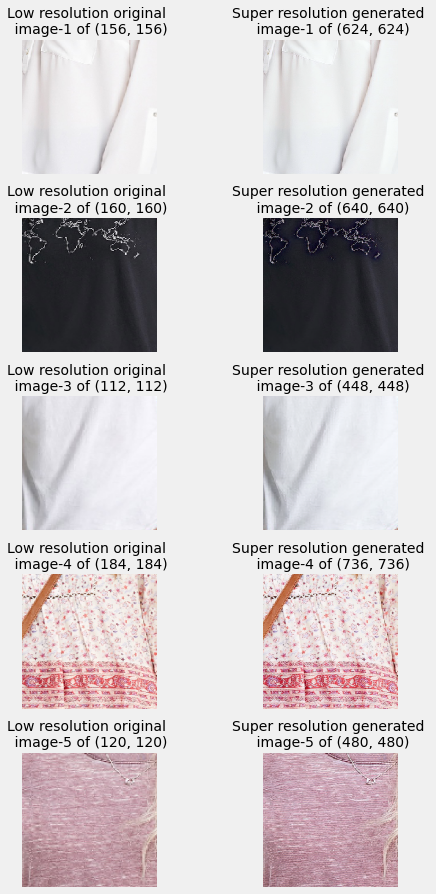

In [30]:
# Load images already saved
IMAGE_PATH = "../input/socks-images-deeplabv3plus-inceptionv3/patches/"

# Or use produced images
# IMAGE_PATH = "./patch_images/"

SAVED_MODEL_PATH = "https://tfhub.dev/captain-pool/esrgan-tf2/1"

# Get original images
patches = get_images(IMAGE_PATH, "patch")

# We'll use only five images as samples
patches = patches[0][0:5]

print("\n")

# Load the GAN model
gan_model = hub.load(SAVED_MODEL_PATH)

# Generate high resolution images from low resolution images
hr_images, fake_images = make_hi_lo_res_images(gan_model, patches)

print("\n\n")

# Display original low resolution and generated high resolution images
if hr_images:
    plot_image(hr_images, fake_images)
else:
    print("Images are too small to enhance")
    
# Save enhanced images
# Create a directory if not exists
!mkdir -p fake_images

# Create a folder name to store images
fake_folder_name = "fake_images"

# Save and zip images
try:
    save_and_ouput_file(fake_images, fake_folder_name)

    # Zip output to load and attach them to the notebook later
    !zip -r fake_images/hi_res_images.zip ./

except:
    print("No enhanced images exist to save!")

The results look great. We have the same images without distortion, and they are high-resolution now. We save them in the *fake_images* folder.<br>

We can proceed with these enhanced patches to group the items that they belong. However, we need to get patches from all images in the DeepFashion dataset to achieve this. Neither RAM nor time will be enough to handle it. Even Superman has his limits!<br>

So, I will introduce a new dataset in the attachment, **socks images**, to address the issue. It is a small, 117-piece dataset that yet will help us with what we want to do. Logic and procedure are the same, it is just faster.<br>

In [31]:
# Clean up
del clothes_images
del clothes_masks
del train_images
del val_images
del test_images
del train_masks
del val_masks
del test_masks
del cropped_segments
del rgb_images
del patches
del fake_images
gc.collect()

19136

## 6. A New Dataset

In [32]:
# Get all images and read them
socks_image_path = "../input/socks-images-deeplabv3plus-inceptionv3/socks_images/product_images/"
socks_images,_ = get_images(socks_image_path, "socks")
pro_socks_images = [mpimg.imread(image) for image in socks_images]

Number of socks images: 117




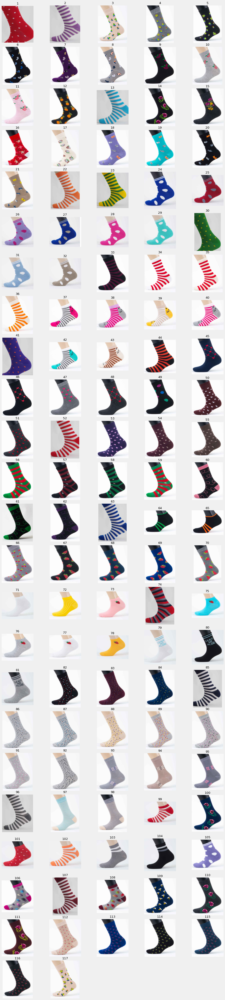

In [33]:
# Display all images in the test set
display_test_images(pro_socks_images, cols=5)

Someone took these images under the same lighting conditions with the same camera and settings in the same place during the same month in the same year. How do I know? Because I took them all!<br>

If you look at the socks, you see many of them belong to a specific series. For example, 37, 38, 39, 40, 42, and 43 share a pattern, while 46, 47, and 48 have another design. In general, three to five items belong to one category. I call them "style groups."<br>

When grouping socks by pattern, we shouldn't expect clustering to match style groups, otherwise it doesn't make sense. Style groups can be set as categorical variables and don't require clustering. Therefore, the clustering method should go beyond that and group a few style groups under one larger category.<br>

Since socks images all have the same standard photographic parameters, we can input them directly into the model. However, the patch extraction approach, as we had before, could give us more robust results. We first need to correct the 30-degree anti-clockwise standing of items in the pictures and then take a patch from them. This time, patch extraction will be much more straightforward.<br>

In [34]:
def take_patch(image, central_fraction = 0.70):
    
    # Open original image
    original_image = Image.open(image)
    
    # Rotate image by -30 Degree
    rotated_image = original_image.rotate(-30)
    
    # Setting the points for cropped image
    left = 150
    top = 50
    right = 450
    bottom = 500

    # Cropped image of above dimension
    cropped_image = rotated_image.crop((left, top, right, bottom))
    
    # Central crop
    fractal_array = tf.keras.preprocessing.image.img_to_array(cropped_image)
    fractal = tf.image.central_crop(fractal_array, central_fraction)
    fractal_image = tf.keras.preprocessing.image.array_to_img(fractal)
    
    return original_image, rotated_image, fractal_image

In [35]:
%%capture

# Store images
original_images = []
rotated_images = []
fractal_images = []

# Crop patch from images
for i, socks_image in enumerate(socks_images):
    
    # Get original, rotated and cropped images
    original_image, rotated_image, fractal_image = take_patch(socks_image, 0.50)
    
    # Store the obtained images
    original_images.append(original_image)
    rotated_images.append(rotated_image)
    fractal_images.append(fractal_image)
    
# Create a directory if not exists
!mkdir -p fractal_images

# Create a folder name to store images
folder_name = "fractal_images"

# Save images as png file
for i in range(len(fractal_images)):
    fractal_images[i].save(f"{folder_name}/{str(i+1)}.png")

# Zip output to load and attach them to the notebook later
!zip -r fractal_images/cropped_images.zip ./

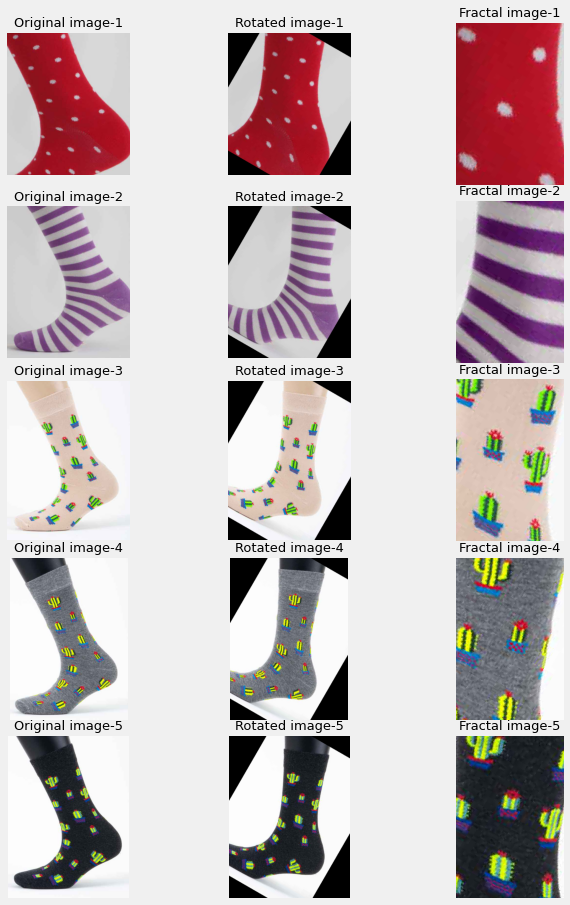

In [36]:
# Number of images to display
no_of_images = 5

# Figure size and subplots
fig, axes = plt.subplots(nrows=no_of_images, ncols=3, figsize=(9, no_of_images*3))
plt.subplots_adjust(wspace=0.8, hspace=0.1)

# Display first 10 images as samples
for i, (img1, img2, img3) in enumerate(zip(original_images[:no_of_images], rotated_images[:no_of_images], fractal_images[:no_of_images])):
    
    # Original image
    title_original = f"Original image-{i+1}"
    this_ax = axes[i, 0]
    display_images(this_ax, title_original, img1)
    
     # Rotated image
    title_rotated = f"Rotated image-{i+1}"
    this_ax = axes[i, 1]
    display_images(this_ax, title_rotated, img2)
    
    # Cropped image
    title_fractal = f"Fractal image-{i+1}"
    this_ax = axes[i, 2]
    display_images(this_ax, title_fractal, img3)

I have showed five pieces as an example.<br>

After we rotated the images by 30-degree clockwise, we called the TensorFlow central cropping method to extract the patches. I tried fraction ratios of 50% and 70% and then decided to go with the former. Results can be seen above.<br>

When I saw the results, I realized I had made a mistake when photographing the socks. I should have taken close-up shots of them rather than later rotating and cropping. That way would have been a lot easier and more accurate.<br>

We save the results in the *fractal_images* folder. Next, we need a numerical representation of the patch images to group them.<br>

## 7. Vector Representation by Siamese Network

Patch images are ready as .png files. We need to get a vector representation of them, which we can accomplish by Siamese Network and Triplet Loss.<br>

Siamese Triplet Loss Architecture (STLA) computes the features of an image. Triplet loss was first introduced by Google in 2015.<br>

The model takes three inputs: anchor image, positive image, and negative image. The anchor is the one we want to learn its features. The positive image displays the same person or object in the first one but in a different state. For example, we may think of them as something like a person photographed on a sunny day and on a rainy day. The negative image is entirely irrelevant, showing a different person or object.<br>

<h3 style="color: #6A006A; text-align: center">Figure-6: Siamese Triplet Loss Architecture </h3><br>

STLA minimizes the distance between an anchor and a positive, both of which have the same identity, and maximizes the distance between the anchor and a negative of a different identity.[[34]](https://arxiv.org/pdf/1503.03832.pdf)<br>

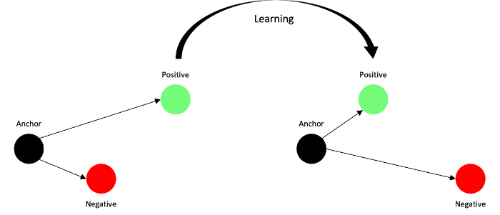<br>
<div align="center"><font size="2">Image source: </font></div><a href="https://arxiv.org/pdf/1503.03832.pdf"><p style="text-align:center">[35]</p></a>

All three inputs share the parameters of the model. The resulting embedding vector of the anchor image is the learned set of features, which minimizes the triplet loss.<br>

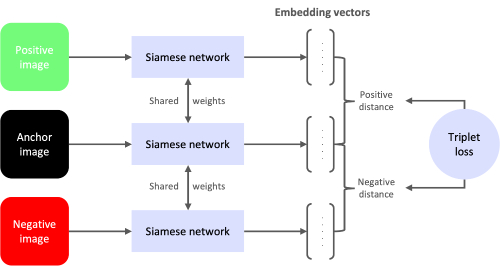
<div align="center"><font size="2">Image by author </font></div>

In [37]:
# To see how the model trains with five epochs as an example.
# The saved model was trained on ten epochs.
TRAIN = 1
EPOCHS = 5

In [38]:
# Create negative images
def create_negative_images(source_list):
    
    # Copy another image list as negative images
    images = copy.deepcopy(source_list)

    # Reverse the new list
    images.reverse()

    # Number of images
    images_len = len(images)
    print(f"Number of negative images:", images_len)
    
    return images


 # Preprocess and resize images
def preprocess_image(image, ext, TARGET_SIZE):
    
    if tpu:
        # For TPU only (Use thıs!)
        with open(image, "rb") as local_file:
            image_str = local_file.read()
    else:   
        # Non-TPU case
        image_str = tf.io.read_file(image)

    if ext == "jpeg":
        image = tf.image.decode_jpeg(image_str, channels=3)
    elif ext == "png":
        image = tf.image.decode_png(image_str, channels=3)
    image = tf.image.resize(image, TARGET_SIZE)
    image = preprocess_input(image)
    
    return image


# Data augmentation
@tf.function
def augment_image(image):
    # Rotate image
    image = tfa.image.rotate(image, 10, interpolation='nearest')
    # Randomly change brightness
    image = tf.image.adjust_brightness(image, delta=random.choice(np.linspace(0,0.2,5)))
    # Randomly change contrast
    image = tf.image.adjust_contrast(image, contrast_factor=random.choice(np.linspace(0.5,0.7,5)))
    
    return image

We will use InceptionV3[[36]](https://keras.io/api/applications/inceptionv3/) as the backbone network. InceptionV3 outputs a vector of 2048 size, which is too large for the 117-sample dataset. We have two options: either we can apply Principal Component Analysis (PCA) and reduce dimensionality or do transfer learning and train the last layer of InceptionV3. For this competition, we thought the latter is more appropriate. Considering the socks data size, we will try vector sizes of 4, 8, and 16 elements to encode examples.<br>

Since our socks images dataset is too small to train the last layer, we refer to CIFAR-100 images[[37]](https://www.kaggle.com/datasets/ilidiomarcio/cifar100images). It could have been better to perform the training of the last layer with socks images, but we don't have enough data on it. In CIFAR-100, there are 60,000 images in 100 classes. To avoid computational intensity, we will use only five flower classes which make up 2,500 samples. One drawback of the siamese network model is using three images in parallel to compute the embedding vector of the anchor. In other words, to find the feature vector of one picture, we need to use three samples as input, which increases complexity. To ease this problem, we randomly pick 1,024 flower samples for training.<br>

1,024 flower images will serve as an anchor. How about positive and negative images? We apply a mild data augmentation to anchor images to derive positive counterparts. `augment_image` function will do little rotation and make random adjustments of contrast and brightness without spoiling the sample. `create_negative_images` method can create the negative set by reversing the anchor image list. When the number of examples in the anchor dataset is odd, the image in the center will be the same both in the anchor and negative data. If the data size is big, it is not a problem, but to avoid any imperfection, we can adjust the number of examples to even size.<br>

When all three input data are ready, we can preprocess them (`preprocess_image`) and create train and validation datasets by `create_dataset`. There we also split the data by split ratio, train it with batches, and allow for concurrent processing with prefetch. If we load the trained model already, we skip splitting the dataset.<br>

In [39]:
def create_dataset(anchor_imgs, positive_imgs, negative_imgs, y):
    
    # Labels tensor
    y_values = tf.convert_to_tensor(y, dtype=tf.float32)

    # Dataset
    dataset = tf.data.Dataset.from_tensor_slices(({"anchor_input": anchor_imgs, "positive_input": positive_imgs, "negative_input": negative_imgs}, y_values))
    dataset = dataset.shuffle(BUFFER_SIZE)
    
    if TRAIN == 1:
    
        # Train, validation split
        train_dataset = dataset.take(round(TRAIN_SAMPLES * SPLIT_RATIO))
        valid_dataset = dataset.skip(round(TRAIN_SAMPLES * SPLIT_RATIO))

        # Batch
        train_dataset = train_dataset.batch(batch_size=BATCH_SIZE, drop_remainder=False)
        train_dataset = train_dataset.prefetch(buffer_size=AUTOTUNE)

        valid_dataset = valid_dataset.batch(batch_size=BATCH_SIZE, drop_remainder=False)
        valid_dataset = valid_dataset.prefetch(buffer_size=AUTOTUNE)

        return train_dataset, valid_dataset
    
    else:
        
        return dataset

We can see a few samples from the preprocessed anchor, positive and negative image dataset ready to train.<br>

In [40]:
def prepare_plot(figure_size, dataset):
    
    # Images to display   
    samples = train_dataset.take(1) # take samples from the dataset
    samples = list(samples.as_numpy_iterator())[0]
    inputs, labels = samples
    anchor = inputs['anchor_input']
    positive = inputs['positive_input']
    negative = inputs['negative_input']
    samples_len = len(anchor)    

    # Plot parameters
    fig = plt.figure(figsize=figure_size)
    axes = fig.subplots(samples_len, 3) # rows: samples, cols: anchor, positive, negative
    plt.subplots_adjust(wspace=0.5, hspace=0.1)
    
    # Display images
    for i in range(samples_len):
        display_images(axes[i, 0], "a-"+str(i+1), anchor[i]) # anchor
        display_images(axes[i, 1], "p-"+str(i+1), positive[i]) # positive
        display_images(axes[i, 2], "n-"+str(i+1), negative[i]) # negative
        
    print("\n" * 2)

In [41]:
# The below code is only necessary if training is required.
# We run it only to show its output without the need to train it.

    
# LOAD AND PREPROCESS TRAIN IMAGES

# Directory path
image_path = '../input/cifar100images/CIFAR100/TRAIN/'

# Flowers, 500 png images per sub-class
flower_names = ["orchid", "poppy", "rose", "sunflower", "tulip"]

# Collect flower images
flowers = []
for flower_name in flower_names:
    filepath = image_path + flower_name + "/"
    flowers.extend(get_images(filepath, flower_name)[0])

# Select samples randomly
flowers = random.sample(flowers, TRAIN_SAMPLES)

# # Preprocess anchor, positive and negative images
anchor_img_input = [preprocess_image(image, "png", TARGET_SIZE) for image in flowers]
negative_img_input = create_negative_images(anchor_img_input)
negative_img_input = [augment_image(image) for image in negative_img_input]
positive_img_input = [augment_image(image) for image in anchor_img_input] 
del flowers


# CREATE DATASET

# Dataset
y_value = np.zeros(TRAIN_SAMPLES)
y_value += -2 + ALPHA # y value
train_dataset, valid_dataset = create_dataset(anchor_img_input, positive_img_input, negative_img_input, y_value)            


Number of orchid images: 500


Number of poppy images: 500


Number of rose images: 500


Number of sunflower images: 500


Number of tulip images: 500




Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup called...
Cleanup ca

Number of negative images: 1024


In [42]:
images_len = len(negative_img_input)
print(f"Number of negative images:", images_len)

Number of negative images: 1024


In [43]:
# Delete unnecessary data
del anchor_img_input
del negative_img_input
del positive_img_input
gc.collect()

228809

In the following cell, we can see the anchor, positive and negative images that are generated.<br>

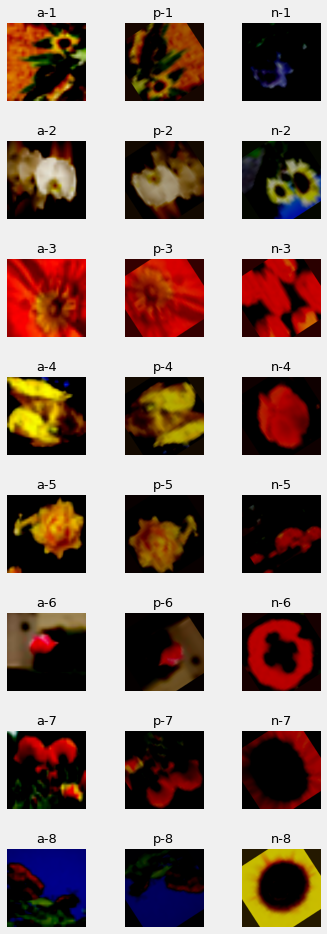

In [44]:
# Display sample images: figure size, number of batch sample images, dataset
prepare_plot((5, (BATCH_SIZE * 2)), train_dataset)

The following is about training the InceptionV3's last layer with CIFAR-100's 1,024 flower images. It will provide us with the output vectors of anchor images. In the final step, we apply L2 normalization. Output vector's values are scaled so that if they were all squared and summed, the total would be 1[[38]](https://stats.stackexchange.com/questions/331926/explain-meaning-and-purpose-of-l2-normalization). That is an important point to remember when discussing the triplet loss definition. The summary of the last layer's results will come next.<br>

In [45]:
# Define embedding model for Siamese network
def embedding_model(INPUT_SHAPE, output_vector=OUTPUT_VECTOR):

    # Retrieve InceptionV3 as the base model
    base_model = InceptionV3(input_shape=INPUT_SHAPE, include_top = False, weights = 'imagenet', pooling='max')

    # Freeze InceptionV3 layers for transfer learning
    base_model.trainable = False

    # Add fully connected layers
    x = Dense(512, name='dense_1', activation='relu')(base_model.output)
    x = BatchNormalization()(x)
    x = Dense(output_vector, name='dense_2')(x)

    # L2 normalization
    x = Lambda(lambda  x: K.l2_normalize(x,axis=1), name='l2_norm')(x)

    model = Model(inputs=base_model.input, outputs=x, name="Embedding")
    
    return model

In [46]:
# Get last layers summary
def print_layer_summary(layers, model):
    
    # Number of the last layers
    last_layers_len = 5

    # Create empty dictionary list
    layers_summary = defaultdict(list)

    # Iterate over the selected layers
    for layer in model.layers[-last_layers_len:]:

        layers_summary['Layer'].append(layer.name) # layer name
        layers_summary['Output Shape'].append(layer.output_shape) # layer output shape
        layers_summary['Param #'].append(layer.count_params()) # layer parameter size

    # Convert to pandas dataframe
    layers_df = pd.DataFrame.from_dict(layers_summary) 

    # Tabulate df
    print("\n" * 2)
    print("InceptionV3 embedding model, added layers:")
    print("-" * 45)
    print(tabulate(layers_df, headers = 'keys', tablefmt = 'github'))
    print("\n" * 2)

Here, we train the architecture[[39]](https://keras.io/examples/vision/siamese_network/), [[40]](https://rutvik-trivedi.github.io/blog/implementations/face-rec-with-siamese-keras.html). We first input anchor, positive and negative image datasets we created earlier to the embedding model we described above and get their output vectors. Then, these vectors are sent to triplet loss to calculate positive and negative distances. To minimize the former and maximize the latter, the model will update parameters during backpropagation, and revise the output vectors until it finds the minimum loss.<br>

<h3 style="color: #6A006A; text-align: center">Figure-7: Triplet Loss</h3><br>

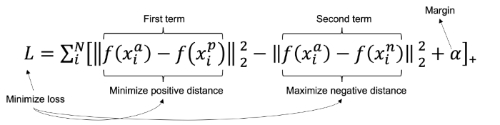<br>
<div align="center"><font size="2">Image source: </font></div><a href="https://arxiv.org/pdf/1503.03832.pdf"><p style="text-align:center">[41]</p></a>

The Triplet loss function involves[[42]](https://www.coursera.org/learn/convolutional-neural-networks/lecture/lUBYU/what-is-face-recognition):<br>

1. The sum of squared values in each vector of anchor, positive and negative images is 1. Because most implementations, as we did here, rescale the encoding vectors to have an L2 norm equal to 1.<br>
2. Positive distance is the distance between the anchor image and the positive image.<br>
3. Negative distance is the distance between the anchor image and the negative image.<br>
4. The first term is the squared positive distance. We want this to be small.<br>
5. The second term is the squared negative distance. We want this to be large.<br>
6. $\alpha$ is the margin. It is a hyperparameter we pick manually for safety considerations.<br>
7. We want the triplet loss as small as possible.<br>

Ideally, the minimum value for the first term is 0, which means there is no difference between the anchor and positive images because they are the same.<br>

According to point 1, anchor and negative vectors are L2 normalized too, and the sum of their squared values is 1. For the distance between them to be as large as possible, we may imagine that both anchor and negative vectors are sparse vectors with only one value as *one* and all other elements as *zero*. The location of *one* in the anchor vector does not correspond to the location of *one* in the negative vector. When we subtract these two vectors from each other, square the resulting vector and then sum its elements, we get 2 $(=(1-0)^2 + (0-1)^2)$. This is the maximum possible negative distance.<br>

The result of the triplet loss formula is a scalar. Minimum positive distance was zero. Therefore, the negative distance is also a scalar, and their largest value can be 2 as a result of the triplet loss formula computation. And that leads us to a total loss of -2 + $\alpha$. Theoretically, the model will calculate the total loss as a maximum of 0 and the resulting loss value.<br>

-2 + $\alpha$ is the utopic loss value that can only occur in Willy Wonka’s Chocolate Factory. We set the actual output value (*y*) as -2 + $\alpha$ when creating the train and validation datasets earlier. In the `siamese_network` function, we set the model's output value (*predicted y*) as triplet loss value. We also monitor the mean squared error (MSE) as the loss statistic when compiling the model. By doing all these, we force the model to converge the triplet loss to Wonka's score, which is -2 + $\alpha$, which in turn should give us the right encoding vectors[[43]](https://towardsdatascience.com/siamese-networks-introduction-and-implementation-2140e3443dee).<br>

In [47]:
# Define Triplet loss
def triplet_loss(anchor, positive, negative, alpha=ALPHA):

    # Calculate distances
    pos_dist = tf.reduce_sum(tf.square(tf.subtract(anchor, positive)), axis=-1) # distance between anchor and positive images
    neg_dist = tf.reduce_sum(tf.square(tf.subtract(anchor, negative)), axis=-1) # distance between anchor and negative images

    # Calculate loss
    basic_loss = tf.add(tf.subtract(pos_dist, neg_dist), alpha)
    loss = tf.reduce_sum(tf.maximum(basic_loss, 0), axis=None)

    return loss    
    
    
# Define Siamese network
def siamese_network(INPUT_SHAPE, OUTPUT_VECTOR):

    # Define triplet input images
    anchor = Input(shape=INPUT_SHAPE, name='anchor_input')
    positive = Input(shape=INPUT_SHAPE, name='positive_input')
    negative = Input(shape=INPUT_SHAPE, name='negative_input')

    # Define model inputs
    inputs = [anchor, positive, negative]

    # Get embedding vectors for anchor, positive and negative images
    anchor_vector = embedding(anchor)
    positive_vector = embedding(positive)
    negative_vector = embedding(negative)

    # Define model output
    outputs = triplet_loss(anchor_vector, positive_vector, negative_vector, alpha=ALPHA)

    # Output will be triplet loss values
    model = Model(inputs=inputs, outputs=outputs, name='Siamese')
    
    # Print model summary
    model.summary()
    print("\n" * 2)
    
    return model

    
# Train siamese network model
def train_model(train_dataset, valid_dataset, lr_scheduler, model_checkpoint_callback, LR, EPOCHS):

#     with strategy.scope():
    model = siamese_network(INPUT_SHAPE, OUTPUT_VECTOR)
    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=LR), loss= 'mse', steps_per_execution=EXE_STEPS)
        
    history = model.fit(train_dataset,  validation_data=valid_dataset, epochs=EPOCHS, callbacks=[lr_scheduler, model_checkpoint_callback], verbose=1)
    
    return history

We initiate the training, display, and save the results here below[[44]](https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint).<br>

In [48]:
# Plot loss
def plot_loss(history):
    
    plt.plot(history.history['loss'], label='train_loss')
    plt.plot(history.history['val_loss'], label='val_loss')
    plt.title('Siamese Network')
    plt.xlabel('Number of Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

We show the training for vector size of 16 as an example.<br>

87924736/87910968 [==============================] - 0s 0us/step



InceptionV3 embedding model, added layers:
---------------------------------------------
|    | Layer                   | Output Shape   |   Param # |
|----|-------------------------|----------------|-----------|
|  0 | global_max_pooling2d    | (None, 2048)   |         0 |
|  1 | dense_1                 | (None, 512)    |   1049088 |
|  2 | batch_normalization_103 | (None, 512)    |      2048 |
|  3 | dense_2                 | (None, 16)     |      8208 |
|  4 | l2_norm                 | (None, 16)     |         0 |



Model: "Siamese"
__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
anchor_input (InputLayer)       [(None, 299, 299, 3) 0                                            
____________________________________________________________________________________________

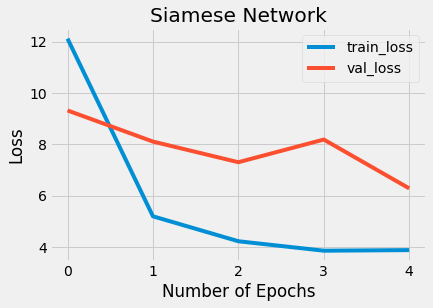




CPU times: user 2min 12s, sys: 29.3 s, total: 2min 42s
Wall time: 3min 7s


In [49]:
%%time

# OUTPUT
# If the model needs to be trained first 
if TRAIN == 1:

    # BUILD MODELS

    # Embedding model
    embedding = embedding_model(INPUT_SHAPE, output_vector=OUTPUT_VECTOR)
    
    # Get last layers' summary
    print_layer_summary(5, embedding)
       
    # Define checkpoint to save the best model (Use this!)
    checkpoint_filepath = './models/inceptionv3_embed_model_checkpoint'
    model_checkpoint_callback = ModelCheckpoint(filepath=checkpoint_filepath, monitor='val_loss', verbose=0, 
                                                save_best_only=True, save_weights_only=True, mode='min', save_freq='epoch')
#     # TPU    
#     save_locally = tf.saved_model.SaveOptions(experimental_io_device='/job:localhost')
#     checkpoints_cb = tf.keras.callbacks.ModelCheckpoint('./checkpoints', options=save_locally)
#     model.fit(…, callbacks=[checkpoints_cb])
    
    # Train the model
    history = train_model(train_dataset, valid_dataset, lr_scheduler, model_checkpoint_callback, LR, EPOCHS)
    print("\n" * 2)
    
    # Plot training/validation loss
    plot_loss(history)
    print("\n" * 2)
    
    # Save the embedding model
    filename = './models/' + 'inceptionv3_embedding_model.h5'
    embedding.save(filename)

#     # TPU
#     save_locally = tf.saved_model.SaveOptions(experimental_io_device='/job:localhost')
#     embedding.save('./models/' + 'inceptionv3_embedding_model.h5', options=save_locally)

I have said we would use the socks images cropped with a fractal ratio of 50%, which we call **fractal_images_50** already saved in the attachment. Below, we import and display them.<br>

In [50]:
# Switch back to no training mode
TRAIN = 0

Number of socks images: 117




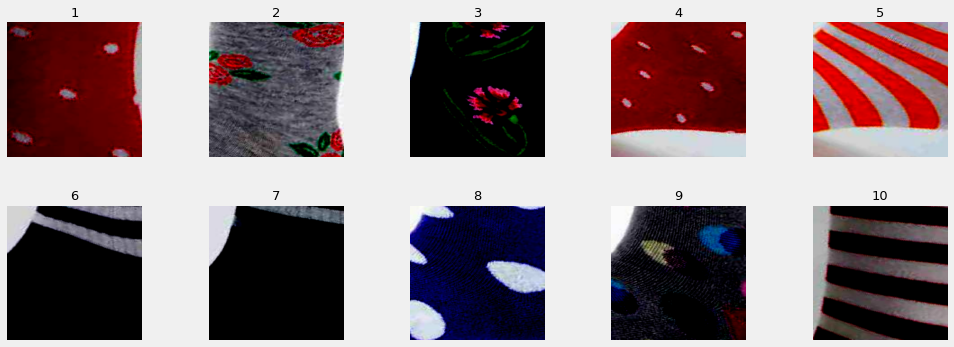

In [51]:
# We will use only fractal images in the model but just in case, 
# we prepare the original images for the model also.

# Import fractal images as jpeg
fractal_image_path = "../input/socks-images-deeplabv3plus-inceptionv3/fractal_images_50/"
fractal_images = get_images(fractal_image_path, "socks")[0]

# Preprocess images
fractal_images_pred = [preprocess_image(image, "jpeg", TARGET_SIZE) for image in fractal_images]
socks_images_pred = [preprocess_image(image, "jpeg", TARGET_SIZE) for image in socks_images]

# Display images (10 items)
display_test_images(fractal_images_pred[:10], cols=5)

My mistake during photography becomes more apparent with these pictures. I can't say that they look fine, but we'll give them a try!<br>

In [52]:
# Select the image dataset to be used: cropped(fractal) or uncropped(original)
# We will select fractal images for the analysis

image_datasets = {"original": socks_images_pred, "fractal": fractal_images_pred}
image_dataset = image_datasets["fractal"]

Our embedding model generates the encoding vectors of images and has the base model as InceptionV3 and the last layer we later trained. We can either train the embedding model from the beginning for some reason or load the model we have already trained before. In other words, we can change hyperparameters and re-train with them, or to save time, we make no changes and use the model saved in the dataset attached to the notebook. We will go with the second option. Thus, we load the model and get the embeddings of the images. As I mentioned earlier, we compute three different sizes of encoding vectors: 4, 8, and 16 elements. This loading and prediction process takes place in the following cells. Once we have the vectors, we can go on with clustering.<br>

In [53]:
# Get the embedding vectors of images
def get_embedding(images, embedding_mod):
    
    # Expand the dimension
    images = [np.expand_dims(img, axis=0) for img in images]
    
    # Get the vector representation. Small size data, pass it in a single batch for higher speed
    embeddings = [embedding_mod.predict_on_batch(img) for img in images]
    
    # Normalize to input embedding vector into further analysis later
    embeddings = [embedding / np.linalg.norm(embedding, ord=2) for embedding in embeddings]
    
    print("number of embedding vectors:", len(embeddings))
    print("embedding of the first element:", embeddings[0])
    print("embedding shape:", embeddings[0].shape)
    print("\n" * 2)
    
    return embeddings

In [54]:
# Create siamese model for vectorization
def create_siamese_model(output_vector):

    # Model
    model = embedding_model(INPUT_SHAPE, output_vector=output_vector)
    
    model.compile(optimizer=keras.optimizers.Adam(learning_rate=LR), loss='mse')
    
    return model

In [55]:
# Load the model
def load_the_model(model):   

# We won't use TPU when loading the model
#     with strategy.scope():
#         load_locally = tf.saved_model.LoadOptions(experimental_io_device='/job:localhost')
#         loaded_model = tf.keras.models.load_model(filename, options=load_locally)
        
    # Load the model (Use this!)
    loaded_model = load_model(model)
    
    # Print the information for layers added to the inception model
    print_layer_summary(5, loaded_model)
    
    return loaded_model

In [56]:
# Load the latest model

# Embedding models depending on the output vector
# model_path = "../input/socks-images-deeplabv3plus-inceptionv3/"
# embedding_models = [model_path + 'inceptionv3_embedding_model_4.h5',
#                    model_path + 'inceptionv3_embedding_model_8.h5',
#                    model_path + 'inceptionv3_embedding_model_16.h5']

# Load the best models
model_path = "../input/socks-images-deeplabv3plus-inceptionv3/"
embedding_models = [model_path + 'embedding_model_4/' + 'inceptionv3_embed_model_checkpoint',
                   model_path + 'embedding_model_8/' + 'inceptionv3_embed_model_checkpoint',
                   model_path + 'embedding_model_16/' + 'inceptionv3_embed_model_checkpoint']

if TRAIN == 1:
    
    # Get embedding vectors for images
    embeddings = get_embedding(image_dataset, embedding)

# If the model needs to be loaded and used to predict only
else:
    
    """ Load the model and get embedding vectors for images. We want to make
    sure which output vector size gives better results."""
#     embedding_4 = load_the_model(embedding_models[0])
#     embeddings_4 = get_embedding(image_dataset, embedding_4)
#     embedding_8 = load_the_model(embedding_models[1])
#     embeddings_8 = get_embedding(image_dataset, embedding_8)
#     embedding_16 = load_the_model(embedding_models[2])
#     embeddings_16 = get_embedding(image_dataset, embedding_16)

    # Create the best model
    embedding_4_model = create_siamese_model(4)
    embedding_8_model = create_siamese_model(8)
    embedding_16_model = create_siamese_model(16)
    
    # Load the best model weights
    embedding_4_model.load_weights(embedding_models[0])
    embedding_8_model.load_weights(embedding_models[1])
    embedding_16_model.load_weights(embedding_models[2])
    
    # Get the embeddings
    embeddings_4 = get_embedding(image_dataset, embedding_4_model)
    embeddings_8 = get_embedding(image_dataset, embedding_8_model)
    embeddings_16 = get_embedding(image_dataset, embedding_16_model)

number of embedding vectors: 117
embedding of the first element: [[-0.90314704  0.12436859 -0.26736498 -0.31204787]]
embedding shape: (1, 4)



number of embedding vectors: 117
embedding of the first element: [[ 0.51008373 -0.33771175  0.21234676  0.39084408  0.22283241 -0.38512632
  -0.28442585  0.38605753]]
embedding shape: (1, 8)



number of embedding vectors: 117
embedding of the first element: [[-0.41527948 -0.5165545   0.18768945  0.0791546   0.34088987  0.23844074
   0.07504849  0.17597148 -0.36853218 -0.05689117 -0.07196498  0.07666426
   0.00971399  0.38379508 -0.10952912  0.00805783]]
embedding shape: (1, 16)





In [57]:
del train_dataset
del valid_dataset
gc.collect()

584

## 8. Clustering by K-Means

We predicted the embeddings of images. To better visualize them, we create a pandas data frame that shows the encoding vector of each fractal image with elements across columns. Since they are multi-dimensional (the smallest has four elements), we apply a PCA plot to visualize them in a 2-D plane as below. That will give us an idea about which encoding vector we should use to implement the K-Means algorithm.<br>

In [58]:
# Create a dataframe of embeddings
def create_dataframe(embedding_vectors):

    # Concatenate all vectors of samples to display as a dataframe
    df = pd.DataFrame(np.concatenate(embedding_vectors))
    display(df.head())
    print("\n")
    
    return df

In [59]:
# Principal Component Analysis (PCA)
def pca(df):
    
    # Two components will be used
    pca = PCA(n_components=2)
    pca.fit(df)
    x_pca = pca.transform(df)
    print("pca shape:", x_pca.shape, "\n")
    
    return x_pca

In [60]:
# Plot PCA analysis
def pca_plot(data_1, data_2, data_3, title_1, title_2, title_3):
    
    # Three subplots
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, sharey=True,figsize=(21,6))
    
    # Set title for the subplot
    ax1.set_title(title_1, fontsize=15)
    # Two component-data, first column as x and second column as y, scatter plot
    ax1.scatter(data_1[:,0],data_1[:,1], cmap='plasma', s=30)
    
    ax2.set_title(title_2, fontsize=15)
    ax2.scatter(data_2[:,0],data_2[:,1], cmap='plasma', s=30)
    
    ax3.set_title(title_3, fontsize=15)
    ax3.scatter(data_3[:,0],data_3[:,1], cmap='plasma', s=30)
    
    plt.show()

,0,1,2,3
0,-0.903147,0.124369,-0.267365,-0.312048
1,-0.761591,0.321042,-0.239048,-0.509674
2,-0.738504,0.585945,0.107685,-0.315728
3,-0.722904,0.047488,0.657711,-0.206328
4,-0.851083,0.199838,-0.180788,0.450598


,0,1,2,3,4,5,6,7
0,0.510084,-0.337712,0.212347,0.390844,0.222832,-0.385126,-0.284426,0.386058
1,0.416614,-0.121617,0.307426,-0.027372,0.547719,-0.575756,-0.132020,0.259733
2,-0.170169,0.298500,0.535231,-0.350618,-0.034308,-0.321719,-0.227423,0.562258
3,0.507813,-0.184221,0.461111,0.277313,0.209064,-0.427246,-0.328198,0.291038
4,0.249798,-0.007068,0.219470,-0.355080,0.453353,-0.181876,-0.689926,0.220675


,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15
0,-0.415279,-0.516554,0.187689,0.079155,0.340890,0.238441,0.075048,0.175971,-0.368532,-0.056891,-0.071965,0.076664,0.009714,0.383795,-0.109529,0.008058
1,-0.340812,-0.609451,0.270794,0.063647,0.235778,0.255758,-0.053615,0.048052,-0.239952,0.036568,-0.192098,0.217571,-0.038653,0.253655,-0.245808,0.198596
2,-0.277657,-0.567943,0.266830,0.141241,0.286846,0.111666,0.175593,0.116487,-0.296529,0.051378,-0.129341,0.231654,-0.302266,0.285171,-0.168573,0.089343
3,-0.309702,-0.506118,0.202145,0.130911,0.384462,0.351726,-0.091112,0.218039,-0.228733,-0.013685,-0.105493,0.167296,0.041421,0.346740,-0.204083,-0.085711
4,-0.326997,-0.510941,0.238583,0.030436,0.245643,0.392495,-0.066688,0.228976,-0.259205,0.067132,-0.224978,0.164095,-0.030223,0.338613,-0.186946,-0.056011




pca shape: (117, 2) 

pca shape: (117, 2) 

pca shape: (117, 2) 



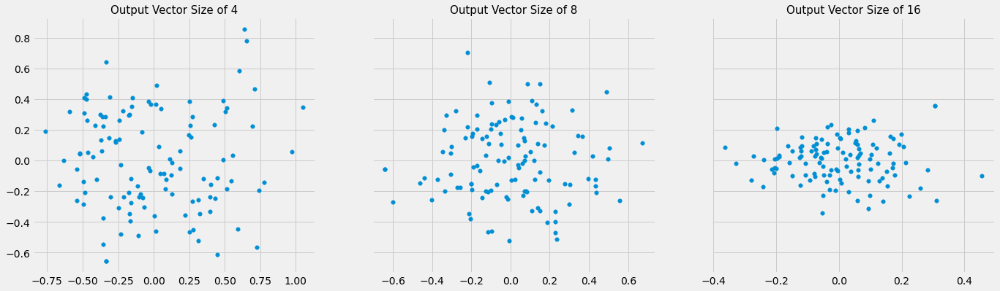

In [61]:
# Create dataframe from embedding vectors
df_4 = create_dataframe(embeddings_4)
df_8 = create_dataframe(embeddings_8)
df_16 = create_dataframe(embeddings_16)

# Implement Principal Component Analysis
x_pca_4 = pca(df_4)
x_pca_8 = pca(df_8)
x_pca_16 = pca(df_16)

# Plot PCA analysis
title_4 = 'Output Vector Size of 4'
title_8 = 'Output Vector Size of 8'
title_16 = 'Output Vector Size of 16'
pca_plot(x_pca_4, x_pca_8, x_pca_16, title_4, title_8, title_16)

I will go with the vector size of 16, but one can try the others also. Next, we will locate the knee and calculate the silhouette score[[45]](https://realpython.com/k-means-clustering-python/) to determine the number of clusters in addition to the PCA plot.<br>

In [62]:
# K-Means clustering
def kmeans_clustering(df, n_clusters, kmeans_kwargs):
    
    # K-Means model and fit
    kmeans = KMeans(n_clusters=n_clusters, **kmeans_kwargs)
    kmeans.fit(df)
    
    # Get cluster labels
    labels = kmeans.labels_
    
    # Get SSE
    sse = kmeans.inertia_
    
    return labels, sse

In [63]:
# K-Means elbow plot
def kmeans_performance_plot(start, end, step, performance_measure, y_label):
    
    """Performance measure can be SSE or silhouette score
    start-to-end represents various cluster numbers"""
    plt.plot(range(start, end, step), performance_measure)
    plt.xticks(range(start, end, step))
    plt.xlabel("Number of Clusters")
    plt.ylabel(y_label)
    plt.show()

In [64]:
# Locate knee
def locate_knee(start, end, step, sse):
    
    # Find the optimal value for number of clusters
    kl = KneeLocator(range(start, end, step), sse, curve="convex", direction="decreasing")
    knee = kl.elbow
    
    return knee

In [65]:
# Calculate silhouette scores
def calculate_silhouette_score(df, labels):
    
    score = silhouette_score(df, labels)
    
    return score

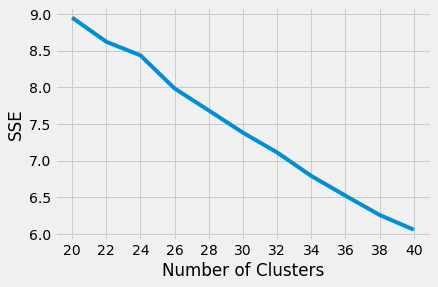



knee value:  None




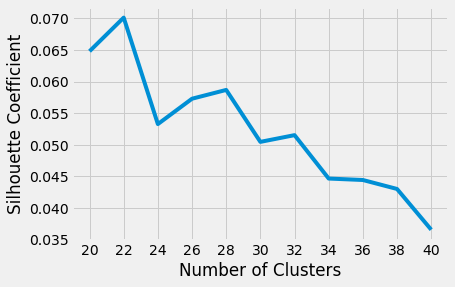

In [66]:
# K-Means arguments
kmeans_kwargs = {
                    "init": "random",
                    "n_init": 10,
                    "max_iter": 300,
                    "random_state": 42,
                }

# A list holds the SSE values for each k
sse = []

# A range of clusters (number from 20 to 40 by step 2)
start, end, step = 20, 42, 2

# Calculate sum of the squared error (SSE)
for k in range(start, end, step):
    labels, loss = kmeans_clustering(df_16, k, kmeans_kwargs)
    sse.append(loss)

# Elbow plot
kmeans_performance_plot(start, end, step, sse, "SSE")
print("\n")

# Locate the knee
knee = locate_knee(start, end, step, sse)
print("knee value: ", knee)
print("\n")


# A list holds the silhouette coefficients for each k
silhouette_coefficients = []

# Calculate silhouette score
for k in range(start, end, step):
    labels, _ = kmeans_clustering(df_16, k, kmeans_kwargs)
    score = calculate_silhouette_score(df_16, labels)
    silhouette_coefficients.append(score)

# Plot silhouette scores
kmeans_performance_plot(start, end, step, silhouette_coefficients, "Silhouette Coefficient")
print("\n")

Then, we implement the K-Means to cluster the images and plot the performance. After completing it, we can display the images in their clusters. The following cells are to perform these tasks.<br>

In [67]:
# Rearrange and sort labels
def rearrange_labels(labels):
    
    # Create empty dictionary list
    labels_dict = defaultdict(list)
    
    # Rearrange values together, which belong to the same cluster
    for i, j in enumerate(labels):
        labels_dict[j].append(i+1)
        
    # Sort the dictionary by key
    labels_dict = collections.OrderedDict(sorted(labels_dict.items()))
    
    return labels_dict

In [68]:
# K-means clustering with the chosen number of clusters
n_clusters = 22
labels,_ = kmeans_clustering(df_16, n_clusters, kmeans_kwargs)

# Rearrange cluster labels
labels_dict = rearrange_labels(labels)

In [69]:
# Show images by cluster
def plot_clustered_images(len_largest_cluster, n_clusters, labels_dict, images):
    
    # Plot configuration
    cols, rows = len_largest_cluster + 1, n_clusters
    fig = plt.figure(figsize=(cols*2, rows*3))
    axes = fig.subplots(rows, cols) # subplots
    plt.subplots_adjust(wspace=0.5, hspace=0.1)
    plt.style.use("default")

    # Hide axes
    for row in range(rows):
        for col in range(cols):
            hide_axes(axes[row, col])

    # Show images by cluster
    for key,value in labels_dict.items():

        # Annotate cluster names in the first column
        text = f"Cluster {str(key+1)}"
        axes[key, 0].annotate(text, xytext=(0.5,0.5), xy=(0.5,0.5), size=12, c="blue")

        # Get the image
        for i in range(len(value)):
            this_ax = axes[key, i+1]
            image_index = value[i]        
            img = images[image_index-1]
            img = mpimg.imread(img)

            # Display the image
            display_images(this_ax, str(i+1), img)

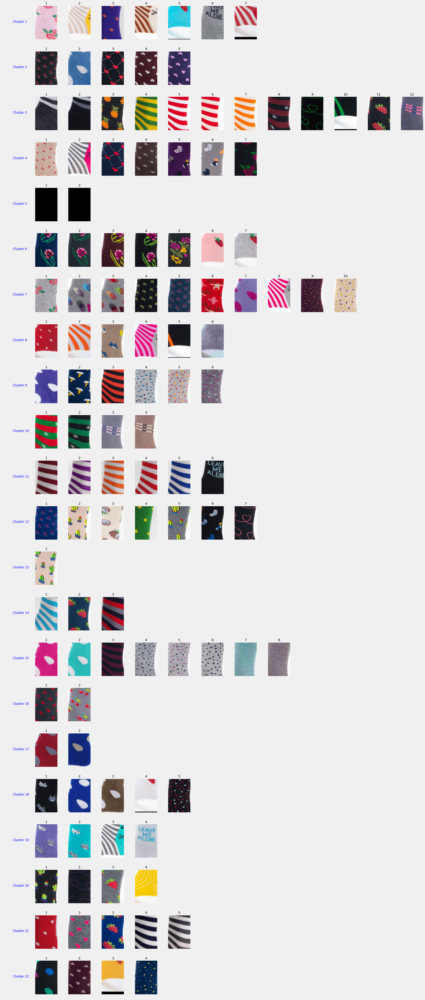

In [70]:
# Get label values
label_values = list(labels_dict.values())

# Find the length of each value
clusters_len = list(map((lambda x: len(x)), label_values))

# Find the length of the most crowded cluster
len_largest_cluster = max(clusters_len)

# Display images by cluster
plot_clustered_images(len_largest_cluster, n_clusters, labels_dict, fractal_images)

Picking the number of clusters as 22 had the goal of making more sense out of clustering so that each cluster would contain more style groups. Though it is achieved to some extent, the results don't seem so great. We need to make improvements. Perhaps, without central cropping or with a different fraction ratio, one could get better results.<br>

Out of curiosity, I also wanted to find the images closest to each of the five randomly selected anchor images using cosine similarity. The first image on the left is the anchor image, and the rest is similar items. However, the results don't seem to make much sense. Curiosity didn't pay off well this time!<br>

(Code for the `find_indices_n_largest_values` function is taken from: [[46]](https://www.geeksforgeeks.org/python-indices-of-n-largest-elements-in-list/).)<br>

In [71]:
# Calculate cosine similarity
def calculate_cosine_similarity(v1, v2):
    
    # Calculate cosine similarity between vector 1 and vector 2
    cosine_sim = np.sum(v1*v2, axis=1)/(norm(v1, axis=1)*norm(v2, axis=1))
    
    # Convert to a single float number
    cosine_sim = cosine_sim.tolist()[0]
    
    return cosine_sim


# Find and store cosine similarities
def generate_cos_sim_dict(df):

    # Number of rows in the dataframe
    rows = len(df)

    # From 0 to 116, 116 rows
    for row in range(rows-1):

        # First vector (anchor)
        vector_1 = df.iloc[row:row+1,:].values

        # From 1 to 117, 116 rows
        for inner_row in range(row+1, rows):

            # All other vectors following the anchor vector
            vector_2 = df.iloc[inner_row:inner_row+1,:].values

            # Calculate the cosine similarity between the anchor vector and each of the consecutive vectors
            cos_sim = calculate_cosine_similarity(vector_1, vector_2)

            # Add to the dictionary
            cos_sim_dict[row].append(cos_sim)
            
    return cos_sim_dict


# Find indices of n largest elements in a list
def find_indices_n_largest_values(a_list, n_values):
    
    indices = sorted(range(len(a_list)), key = lambda x: a_list[x])[-n_values:]
    
    print("Indices list of max n elements is : " + str(indices))
    
    return indices


# Find and display the closest n images of target images
def get_closest_images(images, cos_sim_dict, target_image_len, n_values):
    
    # Sample the target images
    target_image_keys = random.sample(list(cos_sim_dict.keys()), target_image_len)
    print("target_image_keys:", target_image_keys)
    
    # Empty list
    target_images = []
    
    for target_image_key in target_image_keys:
        
        # Find the cosine similarity list of each target list element
        target_list = cos_sim_dict[target_image_key]
        
        # Get indices of n largest elements in the target list
        indices = find_indices_n_largest_values(target_list, n_values)
        
        # First add the anchor image
        target_images.append(images[target_image_key])
        
        for index in indices:
        
            # Find the image by index in the given list
            selected_image = images[index]
            
            # Add selected image to the new list
            target_images.append(selected_image)
            
    # Display selected images
    target_images = [mpimg.imread(image) for image in target_images]
    display_test_images(target_images, n_values+1)
        
    return target_images

target_image_keys: [102, 41, 9, 62, 84]
Indices list of max n elements is : [2, 5, 12, 11]
Indices list of max n elements is : [27, 40, 9, 31]
Indices list of max n elements is : [97, 23, 22, 67]
Indices list of max n elements is : [43, 24, 13, 22]
Indices list of max n elements is : [2, 8, 5, 21]


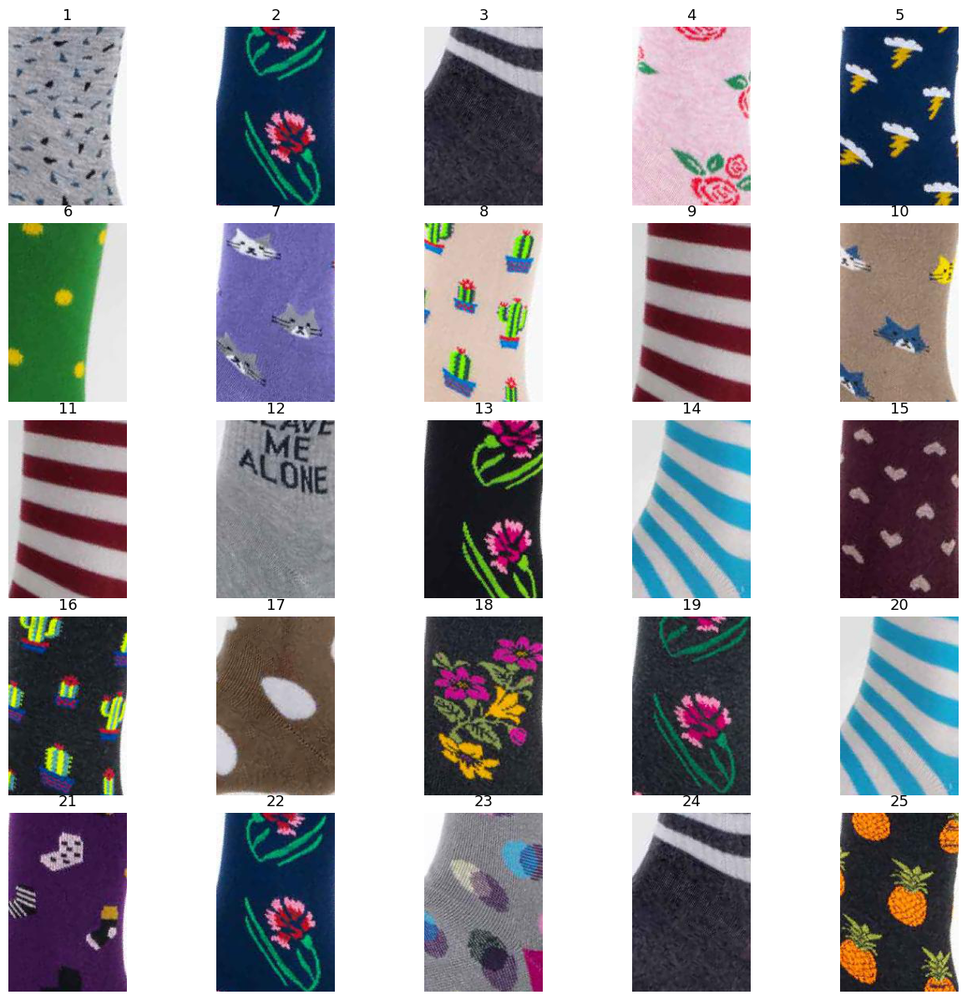

In [72]:
# Create an empty list dictionary
cos_sim_dict = defaultdict(list)

# Find and store cosine similarities between the elements in a dataframe
cos_sim_dict = generate_cos_sim_dict(df_16)

# The number of anchor images for which we'll find the closest images
target_image_len = 5

# The number of closest images for each anchor image
n_values = 4

# Get and display the anchor image and its closest images
# First left image in each row is the anchor image, the rest in the row are the closest images
target_images = get_closest_images(fractal_images, cos_sim_dict, target_image_len, n_values)

## 9. Concluding Remarks

### 9.1. What to improve?

I can summarize a few ideas that come into my mind to improve the above results as follows:<br>
1. We can use a lot larger socks images data, and train the last layer of InceptionV3 with a part of them.<br>
2. Rather than cropping the images, we can take a close-up shot at the pattern of socks, and use them as the input.<br>
3. Socks have different sizes and models such as mute, no-show, extra low cut, low cut, anklets, mid calf, over the calf, knee high and over the knee. We may introduce the product model (size) as a categorical variable in performing K-Means.<br>
4. With more data, we can try a larger encoding vector.<br>
5. Manipulating hyperparameters is already a classical option.<br>

### 9.2. How to use?

If the model's results are satisfactory, where and how can we employ this model and data? Well, there is a plenty of options, an unexhaustive list of which I can suggest as follows:<br>
* We can monitor sales by clusters and see which ones are performing the best and the worst. We can drop the low-performing ones.<br>
* We can expand the top-performing product models with new items or use GAN to create more models.<br>
* Hot-encoding clusters, we can see their relative effect on sales performance.<br>
* By taking pictures of the clothes of customers visiting stores, recording their purchased items, or collecting the images of products they spent more time seeing while surfing on an e-commerce store, companies can offer similar products to their customers. So, they can use this model as a part of their recommender systems.<br>

## Sources

* A Simple TF 2.1 notebook, https://www.kaggle.com/code/philculliton/a-simple-tf-2-1-notebook/notebook<br>
* Large-scale Fashion (DeepFashion) Database, https://mmlab.ie.cuhk.edu.hk/projects/DeepFashion.html<br>
* DeepFashion: In-shop Clothes Retrieval, http://mmlab.ie.cuhk.edu.hk/projects/DeepFashion/InShopRetrieval.html<br>
* readme.md, https://drive.google.com/file/d/19EUeP8Oa7lpRkD9CC5LARQ_93XopokaB/view<br>
* DeepFashion Data Preparation, https://github.com/hsaltan/Machine-Learning/tree/main/DeepFashion%20Data%20Preparation<br>
* DeepFashion_In-shop_Clothes_Retrieval, https://www.kaggle.com/datasets/hserdaraltan/deepfashion-inshop-clothes-retrieval<br>
* DeepFashion_In-shop_Clothes_Retrieval_Adjusted, https://www.kaggle.com/datasets/hserdaraltan/deepfashion-inshop-clothes-retrieval-adjusted<br>
* tf.keras.callbacks.LearningRateScheduler, https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/LearningRateScheduler<br>
* Get Started With Semantic Segmentation, https://www.kaggle.com/code/rajkumarl/get-started-with-semantic-segmentation/notebook<br>
* Data augmentation, https://www.tensorflow.org/tutorials/images/data_augmentation<br>
* tf.image.adjust_contrast, https://www.tensorflow.org/api_docs/python/tf/image/adjust_contrast<br>
* Encoder-Decoder with Atrous Separable Convolution for Semantic Image Segmentation, https://arxiv.org/pdf/1802.02611.pdf<br>
* Multiclass semantic segmentation using DeepLabV3+, https://keras.io/examples/vision/deeplabv3_plus/<br>
* Rethinking Atrous Convolution for Semantic Image Segmentation, https://arxiv.org/pdf/1706.05587v3.pdf<br>
* Semantic Image Segmentation with DeepLab in TensorFlow, https://ai.googleblog.com/2018/03/semantic-image-segmentation-with.html<br>
* The Coronation of Napoleon, https://en.wikipedia.org/wiki/The_Coronation_of_Napoleon<br>
* Deeplab Image Semantic Segmentation Network, https://sthalles.github.io/deep_segmentation_network/<br>
* An Introduction to different Types of Convolutions in Deep Learning, https://towardsdatascience.com/types-of-convolutions-in-deep-learning-717013397f4d<br>
* Human-Image-Segmentation-with-DeepLabV3Plus-in-TensorFlow, https://github.com/nikhilroxtomar/Human-Image-Segmentation-with-DeepLabV3Plus-in-TensorFlow.git<br>
* How to find the longest consecutive chain of numbers in an array, https://stackoverflow.com/questions/44392364/how-to-find-the-longest-consecutive-chain-of-numbers-in-an-array<br>
* Guevara, Riker. (2022). Re: Which Image resolution should I use for training for deep neural network?, https://www.researchgate.net/post/Which_Image_resolution_should_I_use_for_training_for_deep_neural_network/6277d066af031d1f67575dbd/citation/download<br>
* ESRGAN: Enhanced Super-Resolution Generative Adversarial Networks, https://arxiv.org/pdf/1809.00219.pdf<br>
* ESRGAN, https://github.com/xinntao/ESRGAN.git<br>
* Image Super Resolution using ESRGAN, https://www.tensorflow.org/hub/tutorials/image_enhancing<br>
* FaceNet: A Unified Embedding for Face Recognition and Clustering, https://arxiv.org/pdf/1503.03832.pdf<br>
* InceptionV3, https://keras.io/api/applications/inceptionv3/<br>
* cifar-100-images, https://www.kaggle.com/datasets/ilidiomarcio/cifar100images<br>
* explain meaning and purpose of L2 normalization, https://stats.stackexchange.com/questions/331926/explain-meaning-and-purpose-of-l2-normalization<br>
* Face Recognition, https://www.coursera.org/learn/convolutional-neural-networks/lecture/lUBYU/what-is-face-recognition<br>
* Image similarity estimation using a Siamese Network with a triplet loss, https://keras.io/examples/vision/siamese_network/<br>
* Face Recognition Using Siamese Network and Triplet Loss, https://rutvik-trivedi.github.io/blog/implementations/face-rec-with-siamese-keras.html<br>
* Siamese Networks Introduction and Implementation, https://towardsdatascience.com/siamese-networks-introduction-and-implementation-2140e3443dee<br>
* tf.keras.callbacks.ModelCheckpoint, https://www.tensorflow.org/api_docs/python/tf/keras/callbacks/ModelCheckpoint<br>
* K-Means Clustering in Python: A Practical Guide, https://realpython.com/k-means-clustering-python/<br>
* Indices of N largest elements in list, https://www.geeksforgeeks.org/python-indices-of-n-largest-elements-in-list/<br>